In [1]:
import torch
import numpy as np
import random

SEED = 0

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

In [2]:
!nvidia-smi

Fri Jun  3 16:28:23 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.84       Driver Version: 460.84       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  TITAN Xp            On   | 00000000:05:00.0 Off |                  N/A |
| 23%   34C    P8    16W / 250W |   4067MiB / 12194MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  TITAN Xp            On   | 00000000:09:00.0 Off |                  N/A |
| 23%   

In [3]:
%cd ..

/tmp/pycharm_project_722


In [6]:
!mkdir -p datasets/coco

In [24]:
!wget -O datasets/coco/stuff_annotations_trainval2017.zip http://images.cocodataset.org/annotations/stuff_annotations_trainval2017.zip
!unzip datasets/coco/stuff_annotations_trainval2017.zip -d datasets/coco

Archive:  datasets/coco/stuff_annotations_trainval2017.zip
   creating: datasets/coco/annotations/
 extracting: datasets/coco/annotations/stuff_train2017_pixelmaps.zip  
 extracting: datasets/coco/annotations/stuff_val2017_pixelmaps.zip  
  inflating: datasets/coco/annotations/stuff_val2017.json  
  inflating: datasets/coco/annotations/stuff_train2017.json  
   creating: datasets/coco/annotations/deprecated-challenge2017/
  inflating: datasets/coco/annotations/deprecated-challenge2017/val-ids.txt  
  inflating: datasets/coco/annotations/deprecated-challenge2017/train-ids.txt  


In [7]:
!wget -O datasets/coco/val2017.zip http://images.cocodataset.org/zips/val2017.zip
!unzip datasets/coco/val2017.zip -d datasets/coco -q

--2022-06-03 16:33:24--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 54.231.203.225
Connecting to images.cocodataset.org (images.cocodataset.org)|54.231.203.225|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘datasets/coco/val2017.zip’

datasets/coco/val20 100%[===================>] 777.80M  47.1MB/s    in 17s     

2022-06-03 16:33:41 (44.8 MB/s) - ‘datasets/coco/val2017.zip’ saved [815585330/815585330]



Archive:  datasets/coco/val2017.zip
   creating: datasets/coco/val2017/
 extracting: datasets/coco/val2017/000000212226.jpg  
 extracting: datasets/coco/val2017/000000231527.jpg  
 extracting: datasets/coco/val2017/000000578922.jpg  
 extracting: datasets/coco/val2017/000000062808.jpg  
 extracting: datasets/coco/val2017/000000119038.jpg  
 extracting: datasets/coco/val2017/000000114871.jpg  
 extracting: datasets/coco/val2017/000000463918.jpg  
 extracting: datasets/coco/val2017/000000365745.jpg  
 extracting: datasets/coco/val2017/000000320425.jpg  
 extracting: datasets/coco/val2017/000000481404.jpg  
 extracting: datasets/coco/val2017/000000314294.jpg  
 extracting: datasets/coco/val2017/000000335328.jpg  
 extracting: datasets/coco/val2017/000000513688.jpg  
 extracting: datasets/coco/val2017/000000158548.jpg  
 extracting: datasets/coco/val2017/000000132116.jpg  
 extracting: datasets/coco/val2017/000000415238.jpg  
 extracting: datasets/coco/val2017/000000321333.jpg  
 extractin

 extracting: datasets/coco/val2017/000000082085.jpg  
 extracting: datasets/coco/val2017/000000129945.jpg  
 extracting: datasets/coco/val2017/000000086956.jpg  
 extracting: datasets/coco/val2017/000000058655.jpg  
 extracting: datasets/coco/val2017/000000427500.jpg  
 extracting: datasets/coco/val2017/000000339870.jpg  
 extracting: datasets/coco/val2017/000000066706.jpg  
 extracting: datasets/coco/val2017/000000311190.jpg  
 extracting: datasets/coco/val2017/000000210855.jpg  
 extracting: datasets/coco/val2017/000000190007.jpg  
 extracting: datasets/coco/val2017/000000182021.jpg  
 extracting: datasets/coco/val2017/000000384136.jpg  
 extracting: datasets/coco/val2017/000000453634.jpg  
 extracting: datasets/coco/val2017/000000160666.jpg  
 extracting: datasets/coco/val2017/000000318080.jpg  
 extracting: datasets/coco/val2017/000000097337.jpg  
 extracting: datasets/coco/val2017/000000441586.jpg  
 extracting: datasets/coco/val2017/000000079034.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000532901.jpg  
 extracting: datasets/coco/val2017/000000074733.jpg  
 extracting: datasets/coco/val2017/000000189698.jpg  
 extracting: datasets/coco/val2017/000000520871.jpg  
 extracting: datasets/coco/val2017/000000300842.jpg  
 extracting: datasets/coco/val2017/000000453722.jpg  
 extracting: datasets/coco/val2017/000000518326.jpg  
 extracting: datasets/coco/val2017/000000450559.jpg  
 extracting: datasets/coco/val2017/000000032038.jpg  
 extracting: datasets/coco/val2017/000000376093.jpg  
 extracting: datasets/coco/val2017/000000163640.jpg  
 extracting: datasets/coco/val2017/000000449909.jpg  
 extracting: datasets/coco/val2017/000000036844.jpg  
 extracting: datasets/coco/val2017/000000195045.jpg  
 extracting: datasets/coco/val2017/000000184400.jpg  
 extracting: datasets/coco/val2017/000000369757.jpg  
 extracting: datasets/coco/val2017/000000442822.jpg  
 extracting: datasets/coco/val2017/000000112626.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000166165.jpg  
 extracting: datasets/coco/val2017/000000188296.jpg  
 extracting: datasets/coco/val2017/000000546829.jpg  
 extracting: datasets/coco/val2017/000000076211.jpg  
 extracting: datasets/coco/val2017/000000284445.jpg  
 extracting: datasets/coco/val2017/000000261888.jpg  
 extracting: datasets/coco/val2017/000000271402.jpg  
 extracting: datasets/coco/val2017/000000195918.jpg  
 extracting: datasets/coco/val2017/000000476787.jpg  
 extracting: datasets/coco/val2017/000000003934.jpg  
 extracting: datasets/coco/val2017/000000052007.jpg  
 extracting: datasets/coco/val2017/000000226903.jpg  
 extracting: datasets/coco/val2017/000000080057.jpg  
 extracting: datasets/coco/val2017/000000516173.jpg  
 extracting: datasets/coco/val2017/000000314177.jpg  
 extracting: datasets/coco/val2017/000000184791.jpg  
 extracting: datasets/coco/val2017/000000579900.jpg  
 extracting: datasets/coco/val2017/000000000285.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000482487.jpg  
 extracting: datasets/coco/val2017/000000198510.jpg  
 extracting: datasets/coco/val2017/000000080153.jpg  
 extracting: datasets/coco/val2017/000000096427.jpg  
 extracting: datasets/coco/val2017/000000348012.jpg  
 extracting: datasets/coco/val2017/000000518213.jpg  
 extracting: datasets/coco/val2017/000000376278.jpg  
 extracting: datasets/coco/val2017/000000056350.jpg  
 extracting: datasets/coco/val2017/000000168458.jpg  
 extracting: datasets/coco/val2017/000000262587.jpg  
 extracting: datasets/coco/val2017/000000151480.jpg  
 extracting: datasets/coco/val2017/000000419312.jpg  
 extracting: datasets/coco/val2017/000000029187.jpg  
 extracting: datasets/coco/val2017/000000067406.jpg  
 extracting: datasets/coco/val2017/000000371749.jpg  
 extracting: datasets/coco/val2017/000000334767.jpg  
 extracting: datasets/coco/val2017/000000190307.jpg  
 extracting: datasets/coco/val2017/000000400794.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000415990.jpg  
 extracting: datasets/coco/val2017/000000107087.jpg  
 extracting: datasets/coco/val2017/000000139099.jpg  
 extracting: datasets/coco/val2017/000000540962.jpg  
 extracting: datasets/coco/val2017/000000275791.jpg  
 extracting: datasets/coco/val2017/000000257169.jpg  
 extracting: datasets/coco/val2017/000000546826.jpg  
 extracting: datasets/coco/val2017/000000147498.jpg  
 extracting: datasets/coco/val2017/000000493286.jpg  
 extracting: datasets/coco/val2017/000000085682.jpg  
 extracting: datasets/coco/val2017/000000412286.jpg  
 extracting: datasets/coco/val2017/000000463283.jpg  
 extracting: datasets/coco/val2017/000000368335.jpg  
 extracting: datasets/coco/val2017/000000337498.jpg  
 extracting: datasets/coco/val2017/000000227044.jpg  
 extracting: datasets/coco/val2017/000000051938.jpg  
 extracting: datasets/coco/val2017/000000028809.jpg  
 extracting: datasets/coco/val2017/000000170474.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000206994.jpg  
 extracting: datasets/coco/val2017/000000259854.jpg  
 extracting: datasets/coco/val2017/000000068093.jpg  
 extracting: datasets/coco/val2017/000000465180.jpg  
 extracting: datasets/coco/val2017/000000006213.jpg  
 extracting: datasets/coco/val2017/000000292330.jpg  
 extracting: datasets/coco/val2017/000000267434.jpg  
 extracting: datasets/coco/val2017/000000428867.jpg  
 extracting: datasets/coco/val2017/000000239347.jpg  
 extracting: datasets/coco/val2017/000000365642.jpg  
 extracting: datasets/coco/val2017/000000155451.jpg  
 extracting: datasets/coco/val2017/000000568290.jpg  
 extracting: datasets/coco/val2017/000000062554.jpg  
 extracting: datasets/coco/val2017/000000057597.jpg  
 extracting: datasets/coco/val2017/000000178469.jpg  
 extracting: datasets/coco/val2017/000000357238.jpg  
 extracting: datasets/coco/val2017/000000263966.jpg  
 extracting: datasets/coco/val2017/000000044260.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000025593.jpg  
 extracting: datasets/coco/val2017/000000231097.jpg  
 extracting: datasets/coco/val2017/000000106881.jpg  
 extracting: datasets/coco/val2017/000000326248.jpg  
 extracting: datasets/coco/val2017/000000354072.jpg  
 extracting: datasets/coco/val2017/000000474028.jpg  
 extracting: datasets/coco/val2017/000000122969.jpg  
 extracting: datasets/coco/val2017/000000167353.jpg  
 extracting: datasets/coco/val2017/000000122962.jpg  
 extracting: datasets/coco/val2017/000000086483.jpg  
 extracting: datasets/coco/val2017/000000541291.jpg  
 extracting: datasets/coco/val2017/000000155341.jpg  
 extracting: datasets/coco/val2017/000000360325.jpg  
 extracting: datasets/coco/val2017/000000172396.jpg  
 extracting: datasets/coco/val2017/000000192716.jpg  
 extracting: datasets/coco/val2017/000000291551.jpg  
 extracting: datasets/coco/val2017/000000189475.jpg  
 extracting: datasets/coco/val2017/000000254016.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000172648.jpg  
 extracting: datasets/coco/val2017/000000513524.jpg  
 extracting: datasets/coco/val2017/000000051738.jpg  
 extracting: datasets/coco/val2017/000000024567.jpg  
 extracting: datasets/coco/val2017/000000054592.jpg  
 extracting: datasets/coco/val2017/000000343149.jpg  
 extracting: datasets/coco/val2017/000000415748.jpg  
 extracting: datasets/coco/val2017/000000308394.jpg  
 extracting: datasets/coco/val2017/000000519522.jpg  
 extracting: datasets/coco/val2017/000000211674.jpg  
 extracting: datasets/coco/val2017/000000253835.jpg  
 extracting: datasets/coco/val2017/000000079031.jpg  
 extracting: datasets/coco/val2017/000000084664.jpg  
 extracting: datasets/coco/val2017/000000323496.jpg  
 extracting: datasets/coco/val2017/000000331604.jpg  
 extracting: datasets/coco/val2017/000000098261.jpg  
 extracting: datasets/coco/val2017/000000451879.jpg  
 extracting: datasets/coco/val2017/000000057027.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000084650.jpg  
 extracting: datasets/coco/val2017/000000408120.jpg  
 extracting: datasets/coco/val2017/000000129416.jpg  
 extracting: datasets/coco/val2017/000000356169.jpg  
 extracting: datasets/coco/val2017/000000558213.jpg  
 extracting: datasets/coco/val2017/000000084031.jpg  
 extracting: datasets/coco/val2017/000000171611.jpg  
 extracting: datasets/coco/val2017/000000276720.jpg  
 extracting: datasets/coco/val2017/000000147338.jpg  
 extracting: datasets/coco/val2017/000000221291.jpg  
 extracting: datasets/coco/val2017/000000194216.jpg  
 extracting: datasets/coco/val2017/000000543528.jpg  
 extracting: datasets/coco/val2017/000000474039.jpg  
 extracting: datasets/coco/val2017/000000447088.jpg  
 extracting: datasets/coco/val2017/000000322163.jpg  
 extracting: datasets/coco/val2017/000000234757.jpg  
 extracting: datasets/coco/val2017/000000569030.jpg  
 extracting: datasets/coco/val2017/000000350388.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000147518.jpg  
 extracting: datasets/coco/val2017/000000090155.jpg  
 extracting: datasets/coco/val2017/000000007795.jpg  
 extracting: datasets/coco/val2017/000000468245.jpg  
 extracting: datasets/coco/val2017/000000307074.jpg  
 extracting: datasets/coco/val2017/000000082696.jpg  
 extracting: datasets/coco/val2017/000000545958.jpg  
 extracting: datasets/coco/val2017/000000411774.jpg  
 extracting: datasets/coco/val2017/000000166747.jpg  
 extracting: datasets/coco/val2017/000000308466.jpg  
 extracting: datasets/coco/val2017/000000021167.jpg  
 extracting: datasets/coco/val2017/000000402473.jpg  
 extracting: datasets/coco/val2017/000000376625.jpg  
 extracting: datasets/coco/val2017/000000347174.jpg  
 extracting: datasets/coco/val2017/000000530146.jpg  
 extracting: datasets/coco/val2017/000000430871.jpg  
 extracting: datasets/coco/val2017/000000300913.jpg  
 extracting: datasets/coco/val2017/000000291861.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000350054.jpg  
 extracting: datasets/coco/val2017/000000551780.jpg  
 extracting: datasets/coco/val2017/000000397303.jpg  
 extracting: datasets/coco/val2017/000000041990.jpg  
 extracting: datasets/coco/val2017/000000351810.jpg  
 extracting: datasets/coco/val2017/000000315450.jpg  
 extracting: datasets/coco/val2017/000000345385.jpg  
 extracting: datasets/coco/val2017/000000513041.jpg  
 extracting: datasets/coco/val2017/000000320554.jpg  
 extracting: datasets/coco/val2017/000000283113.jpg  
 extracting: datasets/coco/val2017/000000167067.jpg  
 extracting: datasets/coco/val2017/000000489014.jpg  
 extracting: datasets/coco/val2017/000000293324.jpg  
 extracting: datasets/coco/val2017/000000087742.jpg  
 extracting: datasets/coco/val2017/000000016439.jpg  
 extracting: datasets/coco/val2017/000000166166.jpg  
 extracting: datasets/coco/val2017/000000129492.jpg  
 extracting: datasets/coco/val2017/000000125405.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000100283.jpg  
 extracting: datasets/coco/val2017/000000417249.jpg  
 extracting: datasets/coco/val2017/000000532855.jpg  
 extracting: datasets/coco/val2017/000000433915.jpg  
 extracting: datasets/coco/val2017/000000477288.jpg  
 extracting: datasets/coco/val2017/000000210502.jpg  
 extracting: datasets/coco/val2017/000000000776.jpg  
 extracting: datasets/coco/val2017/000000166277.jpg  
 extracting: datasets/coco/val2017/000000133631.jpg  
 extracting: datasets/coco/val2017/000000085665.jpg  
 extracting: datasets/coco/val2017/000000378284.jpg  
 extracting: datasets/coco/val2017/000000190853.jpg  
 extracting: datasets/coco/val2017/000000397354.jpg  
 extracting: datasets/coco/val2017/000000353518.jpg  
 extracting: datasets/coco/val2017/000000356427.jpg  
 extracting: datasets/coco/val2017/000000477227.jpg  
 extracting: datasets/coco/val2017/000000033114.jpg  
 extracting: datasets/coco/val2017/000000565045.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000094326.jpg  
 extracting: datasets/coco/val2017/000000549674.jpg  
 extracting: datasets/coco/val2017/000000163951.jpg  
 extracting: datasets/coco/val2017/000000455555.jpg  
 extracting: datasets/coco/val2017/000000575205.jpg  
 extracting: datasets/coco/val2017/000000502336.jpg  
 extracting: datasets/coco/val2017/000000526197.jpg  
 extracting: datasets/coco/val2017/000000504389.jpg  
 extracting: datasets/coco/val2017/000000138550.jpg  
 extracting: datasets/coco/val2017/000000255965.jpg  
 extracting: datasets/coco/val2017/000000405306.jpg  
 extracting: datasets/coco/val2017/000000199681.jpg  
 extracting: datasets/coco/val2017/000000286660.jpg  
 extracting: datasets/coco/val2017/000000300341.jpg  
 extracting: datasets/coco/val2017/000000325483.jpg  
 extracting: datasets/coco/val2017/000000187144.jpg  
 extracting: datasets/coco/val2017/000000281929.jpg  
 extracting: datasets/coco/val2017/000000451155.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000337055.jpg  
 extracting: datasets/coco/val2017/000000456394.jpg  
 extracting: datasets/coco/val2017/000000378605.jpg  
 extracting: datasets/coco/val2017/000000328238.jpg  
 extracting: datasets/coco/val2017/000000522713.jpg  
 extracting: datasets/coco/val2017/000000426241.jpg  
 extracting: datasets/coco/val2017/000000048396.jpg  
 extracting: datasets/coco/val2017/000000416104.jpg  
 extracting: datasets/coco/val2017/000000041633.jpg  
 extracting: datasets/coco/val2017/000000396338.jpg  
 extracting: datasets/coco/val2017/000000404534.jpg  
 extracting: datasets/coco/val2017/000000518770.jpg  
 extracting: datasets/coco/val2017/000000500211.jpg  
 extracting: datasets/coco/val2017/000000299720.jpg  
 extracting: datasets/coco/val2017/000000177357.jpg  
 extracting: datasets/coco/val2017/000000252332.jpg  
 extracting: datasets/coco/val2017/000000276804.jpg  
 extracting: datasets/coco/val2017/000000214224.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000078420.jpg  
 extracting: datasets/coco/val2017/000000322944.jpg  
 extracting: datasets/coco/val2017/000000468501.jpg  
 extracting: datasets/coco/val2017/000000068765.jpg  
 extracting: datasets/coco/val2017/000000570456.jpg  
 extracting: datasets/coco/val2017/000000468577.jpg  
 extracting: datasets/coco/val2017/000000072281.jpg  
 extracting: datasets/coco/val2017/000000322429.jpg  
 extracting: datasets/coco/val2017/000000075456.jpg  
 extracting: datasets/coco/val2017/000000159684.jpg  
 extracting: datasets/coco/val2017/000000361268.jpg  
 extracting: datasets/coco/val2017/000000404923.jpg  
 extracting: datasets/coco/val2017/000000205401.jpg  
 extracting: datasets/coco/val2017/000000225757.jpg  
 extracting: datasets/coco/val2017/000000199977.jpg  
 extracting: datasets/coco/val2017/000000161128.jpg  
 extracting: datasets/coco/val2017/000000086582.jpg  
 extracting: datasets/coco/val2017/000000426203.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000224724.jpg  
 extracting: datasets/coco/val2017/000000287874.jpg  
 extracting: datasets/coco/val2017/000000361142.jpg  
 extracting: datasets/coco/val2017/000000439180.jpg  
 extracting: datasets/coco/val2017/000000177539.jpg  
 extracting: datasets/coco/val2017/000000228981.jpg  
 extracting: datasets/coco/val2017/000000509719.jpg  
 extracting: datasets/coco/val2017/000000071938.jpg  
 extracting: datasets/coco/val2017/000000016502.jpg  
 extracting: datasets/coco/val2017/000000098853.jpg  
 extracting: datasets/coco/val2017/000000094944.jpg  
 extracting: datasets/coco/val2017/000000168883.jpg  
 extracting: datasets/coco/val2017/000000267169.jpg  
 extracting: datasets/coco/val2017/000000422670.jpg  
 extracting: datasets/coco/val2017/000000269866.jpg  
 extracting: datasets/coco/val2017/000000135604.jpg  
 extracting: datasets/coco/val2017/000000009772.jpg  
 extracting: datasets/coco/val2017/000000050380.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000209747.jpg  
 extracting: datasets/coco/val2017/000000311180.jpg  
 extracting: datasets/coco/val2017/000000224051.jpg  
 extracting: datasets/coco/val2017/000000092839.jpg  
 extracting: datasets/coco/val2017/000000460927.jpg  
 extracting: datasets/coco/val2017/000000268375.jpg  
 extracting: datasets/coco/val2017/000000135902.jpg  
 extracting: datasets/coco/val2017/000000162415.jpg  
 extracting: datasets/coco/val2017/000000140840.jpg  
 extracting: datasets/coco/val2017/000000395388.jpg  
 extracting: datasets/coco/val2017/000000208423.jpg  
 extracting: datasets/coco/val2017/000000180296.jpg  
 extracting: datasets/coco/val2017/000000535523.jpg  
 extracting: datasets/coco/val2017/000000348488.jpg  
 extracting: datasets/coco/val2017/000000196759.jpg  
 extracting: datasets/coco/val2017/000000023751.jpg  
 extracting: datasets/coco/val2017/000000041888.jpg  
 extracting: datasets/coco/val2017/000000039477.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000455624.jpg  
 extracting: datasets/coco/val2017/000000534394.jpg  
 extracting: datasets/coco/val2017/000000110884.jpg  
 extracting: datasets/coco/val2017/000000065798.jpg  
 extracting: datasets/coco/val2017/000000438774.jpg  
 extracting: datasets/coco/val2017/000000090062.jpg  
 extracting: datasets/coco/val2017/000000285788.jpg  
 extracting: datasets/coco/val2017/000000004765.jpg  
 extracting: datasets/coco/val2017/000000482970.jpg  
 extracting: datasets/coco/val2017/000000284279.jpg  
 extracting: datasets/coco/val2017/000000187236.jpg  
 extracting: datasets/coco/val2017/000000564336.jpg  
 extracting: datasets/coco/val2017/000000290833.jpg  
 extracting: datasets/coco/val2017/000000082812.jpg  
 extracting: datasets/coco/val2017/000000433103.jpg  
 extracting: datasets/coco/val2017/000000421834.jpg  
 extracting: datasets/coco/val2017/000000211120.jpg  
 extracting: datasets/coco/val2017/000000415727.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000039951.jpg  
 extracting: datasets/coco/val2017/000000566436.jpg  
 extracting: datasets/coco/val2017/000000312213.jpg  
 extracting: datasets/coco/val2017/000000039914.jpg  
 extracting: datasets/coco/val2017/000000411754.jpg  
 extracting: datasets/coco/val2017/000000462728.jpg  
 extracting: datasets/coco/val2017/000000296284.jpg  
 extracting: datasets/coco/val2017/000000349152.jpg  
 extracting: datasets/coco/val2017/000000538236.jpg  
 extracting: datasets/coco/val2017/000000035062.jpg  
 extracting: datasets/coco/val2017/000000549390.jpg  
 extracting: datasets/coco/val2017/000000267670.jpg  
 extracting: datasets/coco/val2017/000000153343.jpg  
 extracting: datasets/coco/val2017/000000005600.jpg  
 extracting: datasets/coco/val2017/000000533493.jpg  
 extracting: datasets/coco/val2017/000000279541.jpg  
 extracting: datasets/coco/val2017/000000208208.jpg  
 extracting: datasets/coco/val2017/000000363188.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000267940.jpg  
 extracting: datasets/coco/val2017/000000493566.jpg  
 extracting: datasets/coco/val2017/000000391722.jpg  
 extracting: datasets/coco/val2017/000000260106.jpg  
 extracting: datasets/coco/val2017/000000292155.jpg  
 extracting: datasets/coco/val2017/000000360943.jpg  
 extracting: datasets/coco/val2017/000000503823.jpg  
 extracting: datasets/coco/val2017/000000106235.jpg  
 extracting: datasets/coco/val2017/000000530854.jpg  
 extracting: datasets/coco/val2017/000000433134.jpg  
 extracting: datasets/coco/val2017/000000270386.jpg  
 extracting: datasets/coco/val2017/000000146155.jpg  
 extracting: datasets/coco/val2017/000000444275.jpg  
 extracting: datasets/coco/val2017/000000178618.jpg  
 extracting: datasets/coco/val2017/000000414261.jpg  
 extracting: datasets/coco/val2017/000000092053.jpg  
 extracting: datasets/coco/val2017/000000218362.jpg  
 extracting: datasets/coco/val2017/000000054931.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000063602.jpg  
 extracting: datasets/coco/val2017/000000488592.jpg  
 extracting: datasets/coco/val2017/000000436315.jpg  
 extracting: datasets/coco/val2017/000000429109.jpg  
 extracting: datasets/coco/val2017/000000409424.jpg  
 extracting: datasets/coco/val2017/000000194506.jpg  
 extracting: datasets/coco/val2017/000000437392.jpg  
 extracting: datasets/coco/val2017/000000424642.jpg  
 extracting: datasets/coco/val2017/000000465585.jpg  
 extracting: datasets/coco/val2017/000000080022.jpg  
 extracting: datasets/coco/val2017/000000186980.jpg  
 extracting: datasets/coco/val2017/000000537802.jpg  
 extracting: datasets/coco/val2017/000000302760.jpg  
 extracting: datasets/coco/val2017/000000105249.jpg  
 extracting: datasets/coco/val2017/000000345469.jpg  
 extracting: datasets/coco/val2017/000000414034.jpg  
 extracting: datasets/coco/val2017/000000289960.jpg  
 extracting: datasets/coco/val2017/000000377368.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000573943.jpg  
 extracting: datasets/coco/val2017/000000001993.jpg  
 extracting: datasets/coco/val2017/000000310980.jpg  
 extracting: datasets/coco/val2017/000000107094.jpg  
 extracting: datasets/coco/val2017/000000096001.jpg  
 extracting: datasets/coco/val2017/000000502136.jpg  
 extracting: datasets/coco/val2017/000000245026.jpg  
 extracting: datasets/coco/val2017/000000186637.jpg  
 extracting: datasets/coco/val2017/000000020333.jpg  
 extracting: datasets/coco/val2017/000000127987.jpg  
 extracting: datasets/coco/val2017/000000561679.jpg  
 extracting: datasets/coco/val2017/000000033005.jpg  
 extracting: datasets/coco/val2017/000000127394.jpg  
 extracting: datasets/coco/val2017/000000009769.jpg  
 extracting: datasets/coco/val2017/000000570664.jpg  
 extracting: datasets/coco/val2017/000000188465.jpg  
 extracting: datasets/coco/val2017/000000549136.jpg  
 extracting: datasets/coco/val2017/000000042563.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000424975.jpg  
 extracting: datasets/coco/val2017/000000217219.jpg  
 extracting: datasets/coco/val2017/000000427160.jpg  
 extracting: datasets/coco/val2017/000000410934.jpg  
 extracting: datasets/coco/val2017/000000214753.jpg  
 extracting: datasets/coco/val2017/000000186422.jpg  
 extracting: datasets/coco/val2017/000000034417.jpg  
 extracting: datasets/coco/val2017/000000176232.jpg  
 extracting: datasets/coco/val2017/000000176847.jpg  
 extracting: datasets/coco/val2017/000000172547.jpg  
 extracting: datasets/coco/val2017/000000423798.jpg  
 extracting: datasets/coco/val2017/000000183437.jpg  
 extracting: datasets/coco/val2017/000000501023.jpg  
 extracting: datasets/coco/val2017/000000203639.jpg  
 extracting: datasets/coco/val2017/000000376284.jpg  
 extracting: datasets/coco/val2017/000000017905.jpg  
 extracting: datasets/coco/val2017/000000078170.jpg  
 extracting: datasets/coco/val2017/000000022969.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000015335.jpg  
 extracting: datasets/coco/val2017/000000156924.jpg  
 extracting: datasets/coco/val2017/000000211825.jpg  
 extracting: datasets/coco/val2017/000000162732.jpg  
 extracting: datasets/coco/val2017/000000118367.jpg  
 extracting: datasets/coco/val2017/000000435208.jpg  
 extracting: datasets/coco/val2017/000000341828.jpg  
 extracting: datasets/coco/val2017/000000475365.jpg  
 extracting: datasets/coco/val2017/000000493613.jpg  
 extracting: datasets/coco/val2017/000000562581.jpg  
 extracting: datasets/coco/val2017/000000047585.jpg  
 extracting: datasets/coco/val2017/000000261535.jpg  
 extracting: datasets/coco/val2017/000000306139.jpg  
 extracting: datasets/coco/val2017/000000011051.jpg  
 extracting: datasets/coco/val2017/000000086755.jpg  
 extracting: datasets/coco/val2017/000000205289.jpg  
 extracting: datasets/coco/val2017/000000149375.jpg  
 extracting: datasets/coco/val2017/000000193245.jpg  
 extracting: datasets/coco/v

 extracting: datasets/coco/val2017/000000301718.jpg  
 extracting: datasets/coco/val2017/000000555050.jpg  
 extracting: datasets/coco/val2017/000000388846.jpg  
 extracting: datasets/coco/val2017/000000323895.jpg  
 extracting: datasets/coco/val2017/000000234660.jpg  
 extracting: datasets/coco/val2017/000000343453.jpg  
 extracting: datasets/coco/val2017/000000540928.jpg  
 extracting: datasets/coco/val2017/000000190756.jpg  
 extracting: datasets/coco/val2017/000000068387.jpg  
 extracting: datasets/coco/val2017/000000151000.jpg  
 extracting: datasets/coco/val2017/000000244592.jpg  
 extracting: datasets/coco/val2017/000000158956.jpg  
 extracting: datasets/coco/val2017/000000058636.jpg  
 extracting: datasets/coco/val2017/000000326174.jpg  
 extracting: datasets/coco/val2017/000000241319.jpg  
 extracting: datasets/coco/val2017/000000244379.jpg  
 extracting: datasets/coco/val2017/000000263796.jpg  
 extracting: datasets/coco/val2017/000000176799.jpg  
 extracting: datasets/coco/v

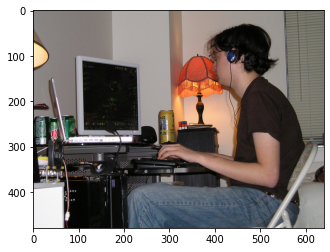

In [20]:
import matplotlib.pyplot as plt
import PIL

plt.imshow(PIL.Image.open("datasets/coco/val2017/000000345252.jpg"))

In [22]:
!ls datasets/coco/val2017/*.jpg

datasets/coco/val2017/000000000139.jpg	datasets/coco/val2017/000000289594.jpg
datasets/coco/val2017/000000000285.jpg	datasets/coco/val2017/000000289659.jpg
datasets/coco/val2017/000000000632.jpg	datasets/coco/val2017/000000289702.jpg
datasets/coco/val2017/000000000724.jpg	datasets/coco/val2017/000000289741.jpg
datasets/coco/val2017/000000000776.jpg	datasets/coco/val2017/000000289938.jpg
datasets/coco/val2017/000000000785.jpg	datasets/coco/val2017/000000289960.jpg
datasets/coco/val2017/000000000802.jpg	datasets/coco/val2017/000000289992.jpg
datasets/coco/val2017/000000000872.jpg	datasets/coco/val2017/000000290081.jpg
datasets/coco/val2017/000000000885.jpg	datasets/coco/val2017/000000290163.jpg
datasets/coco/val2017/000000001000.jpg	datasets/coco/val2017/000000290179.jpg
datasets/coco/val2017/000000001268.jpg	datasets/coco/val2017/000000290248.jpg
datasets/coco/val2017/000000001296.jpg	datasets/coco/val2017/000000290293.jpg
datasets/coco/val2017/000000001353.jpg	datasets/coco/val2017/000

In [26]:
!cat datasets/coco/annotations/stuff_val2017.json

{
"info": {"description": "COCO 2017 Stuff Dataset", "url": "http://cocodataset.org", "version": "1.0", "year": 2017, "contributor": "H. Caesar, J. Uijlings, M. Maire, T.-Y. Lin, P. Dollar and V. Ferrari", "date_created": "2017-08-31 00:00:00.0"},


"images": [{"license": 4, "file_name": "000000397133.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000397133.jpg", "height": 427, "width": 640, "date_captured": "2013-11-14 17:02:52", "flickr_url": "http://farm7.staticflickr.com/6116/6255196340_da26cf2c9e_z.jpg", "id": 397133}, {"license": 1, "file_name": "000000037777.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000037777.jpg", "height": 230, "width": 352, "date_captured": "2013-11-14 20:55:31", "flickr_url": "http://farm9.staticflickr.com/8429/7839199426_f6d48aa585_z.jpg", "id": 37777}, {"license": 4, "file_name": "000000252219.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000252219.jpg", "height": 428, "width": 640, "date_captured": "2013-11-14 22:32:02", "flickr_url": "http://farm4.staticflickr.com/3446/3232237447_13d84bd0a1_z.jpg", "id": 252219}, {"license": 1, "file_name": "000000087038.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000087038.jpg", "height": 480, "width": 64

al2017/000000234757.jpg", "height": 480, "width": 640, "date_captured": "2013-11-17 10:27:43", "flickr_url": "http://farm9.staticflickr.com/8480/8224578886_5716b9a1ff_z.jpg", "id": 234757}, {"license": 3, "file_name": "000000280325.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000280325.jpg", "height": 377, "width": 500, "date_captured": "2013-11-17 11:29:37", "flickr_url": "http://farm4.staticflickr.com/3211/2999990088_53c419d548_z.jpg", "id": 280325}, {"license": 3, "file_name": "000000184338.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000184338.jpg", "height": 427, "width": 640, "date_captured": "2013-11-17 16:33:05", "flickr_url": "http://farm9.staticflickr.com/8190/8111663715_2c24036616_z.jpg", "id": 184338}, {"license": 3, "file_name": "000000417085.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000417085.jpg", "height": 360, "width": 640, "date_captured": "2013-11-17 17:09:04", "flickr_url": "http://farm4.staticflickr.com/3703/927717560

379332.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000379332.jpg", "height": 334, "width": 500, "date_captured": "2013-11-23 03:07:38", "flickr_url": "http://farm4.staticflickr.com/3646/3629717448_50fd2e7bab_z.jpg", "id": 379332}, {"license": 3, "file_name": "000000193743.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000193743.jpg", "height": 640, "width": 427, "date_captured": "2013-11-23 03:45:51", "flickr_url": "http://farm4.staticflickr.com/3269/2977580128_3a80e1d8fc_z.jpg", "id": 193743}, {"license": 1, "file_name": "000000331317.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000331317.jpg", "height": 484, "width": 640, "date_captured": "2013-11-23 17:02:26", "flickr_url": "http://farm1.staticflickr.com/217/510053761_7cc598a801_z.jpg", "id": 331317}, {"license": 5, "file_name": "000000215778.jpg", "coco_url": "http://images.cocodataset.org/val2017/000000215778.jpg", "height": 427, "width": 640, "date_captured": "2013-11-24 01:06:55", "fli

{"segmentation": {"counts": "Y2b7Y201O0000O100000000O100001O001O00O12NO1OaHhM]7X2cHhM]7X2bHiM^7Z2000000000000000000000001O00O1001OO11O0000000000000000000000000000000000000000000000000000000000McHhM]7X2cHgM^7Y221O00O1O10000001O1O000aHfM]7\\20001O00O11OO100001O00000000N22N00000000000000O11O0000000000000000000000000000000000000000000000001O00O1000000O1001O000000000000000000001O00O1000000000000000000001OO10000N2O100000000000000O100001O1aHeM\\7[2dHfM[7]200000000000000000000000MeHfM[7Z2eHfM[7X2eHgM^7Y2bHgM^7Y22J`HmM02`7Q2dHmM\\7S260ZHnM0O00_7[2ON20000000bHgMZ7^2O00000000000000000000O1001O00000000000000000000000000000000000000000000000000O1N2O11ON2O11O002N0000O10000001O1O2N1O00000000000000000000002N0000000000000000000000001OO100O100000000000000000000000000000000000000000000000000001O000000000000000000000000O100000000000000000000001O000000000000000000000\\M`MmM`2S2`MmM`2R2bMmM^2S2bMmM^2S2cMlM]2U2bMkM^2U2bMkM^2U2cMjM]2V2cMjM]2V2dMiM\\2W2dMiM\\2W2dMiM\\2X2cMhM]2X2cMhM]2X2cMhM]2X2dMgM\\2Y2dMgM\\2

{"segmentation": {"counts": "X[Y54U=5K4L4M5J2O1000N2M310O1O01O3MO010O2O001O1LYCAi<;5O100002N1O4K2O010O0001L4JUCHm<1ne6N\\ZI4kB3h<9O1O0001O000O1004VC^Oc<g0N5K0lESOj7m0oGTOSN0m9m0nGTOUN2k9i0oGVOVN1k9i0nGXOTN2m9f0oGCP8=PHDP8;PHFP8:oGMj73VHMj72XHNg71YHOh71ZHLh72ZHLg73[HKf74[HLf73ZHMf73ZHMf72\\HLe75UF]OQ2=j75XF\\Oo1>i74_HKb73^F@Q<>QDBo;<TDDk;:e0L3N3OgY60bZINQ:>]EISOJ];b0[EEo:7YDB`02b;=ZDB4MX;?XECQ9OSF1b12YONQ93PFLn1OoN3R94gFJ_12SNM]95SGa0h0]OgNN]:Q1`FSOPOM`:\\1TFhNZOO_:f1kElNm9`1gEaNX:f0mENS:1RFKn93UFLk91hEhN?U1m90WFNV:DkE<^:[OcEd0^:ZOcEe0^:\\OaE<_OYOP;;aE8[O[OY:2hF<D5Z9OPGLE5[9GWFF04<;33Z9I^FEC1b0?4N[OBm9?mFAXOa0c0NZOAn9`0RGAPO<g00ZOCm9a0_G_O]O=V94ZHChM0n9=[HAiMNL2o9>^H@m7`0^201N3L6KkDKY96cFL\\96cFJ\\9:`FG_9>hEBBMC4S;>`E^O]O;8Mk:;_EO@J0Gg:`0iEg0_OgN4OX:c0UFo0_O^N]:c0TFR1l9mNTFS1_O\\NZ:`0XFZ1i9bNWFb1e9XNlF]1U9`NZGR1g8lNhGe0Z8YOTH:d:JYX1MhgN3bMMiE2S13T9MjEX1DnNc:KaEm1_:WNXEH1S2h:oMWEZ2h:fM[EX2d:iM]EV2^:gMaE22X2]:gM_E05Y2\\:gM_EO6Z2h:00000aEfMl9Z2UFfMj9[2VFeMj9[2UFfMj9[2UFfMk9Y2SFkMU:Q2dEQN]:

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



L<o2;RM`32hKd4Q1_KnNK`0h2@WMU54nJa4m0gKA[2e4^MnJML_4P1kKA\\2g4ZMlJNNa4n0kKC[2d4[MQK_4h0kKD\\2n4g1_KmKE[2k4i1_KlKF\\2j4YM`J\\4P1oKF]2\\3ZMYM[4DnKE`2Y3TMSL5Z1Z4EmKCb2X3\\M_MV4FlKAe2W3\\M`MS4IlK^Oh2W3_M^Ml3MmK]Oi2U3bM`Mh3NmK]Oi2Q3gMcMc3OmK]Oi2n2kMeM`3OlK^Oi2m2lMfM_3OlK^Oi2l2mMgM^3OlK^Oj2i2oMgMkNSO`4o0lK_Ol2d2lMiMmNVOa4n0jK_Ol2d2lMfMlNYO2O`4o0jK_Ol2c2nMcMjN]O1Od4P1gK^Ol2c2nMcMe3<aK^Ol2b2oMcMf3<_K_Ol2b2oMcMf3<_K_Ol2b2nMdMg3;_K@k2a2oMdMg3;_KAj2`2eMXMVO<l4;_KAi2b2]MVN^OhNj4o0bKAi2b2[MZNZ4CbKBg2b2^MXNY4DbKCf2a2^MYN[4BaKDe2b2aMXNW4BcKEd2`2dM[NR4@fKGa2f1YMTN`0o0DeNm3k0ULG`2d1cN\\OdN_NT4j0ULG^2c1fN_O`N`NX4f0TLH^2b1dNLj2jNTLI^2_1cN0k2hNTLI^2_1aN2m2fNTLI_2^1^N5o2dNTLJ_2\\1]N7P3cNTLJ_2\\1\\N7a2oMZLh0:G^2Z1`N5_2QNXLk0;G\\2X1bN5]2YOeLXO^2Y1aN6^2WOcLXO`2[1_N7]2VOdLVOb2]1]N<W2ROjLcNI5m2j1ZN;R2WO[M^N[2P2YN:n1[Oe0;]M9R2YOa0>^M8S2XO?`0_M6T2YO=0PLoN`1f1TOkM\\O3n01f0]1\\2OPLaN0;`1k1aNmM83<9KE@5=X1d3MoKaN2060Y1^2fNlM<8BBKc0:l0g3L]LaNS10_Nm2e0jNEKg3MYNZ1WNoNGLj3I]NX1oMWOHIl3H_N_5a1`JbN^5^1bJdN\\5[1eJhNX5W1iJlN

{"segmentation": {"counts": "aoi141NP=6PCIm<9N3N100WCCf<>ZCCf<`0O0001O01O0000010O0O11N01J_OeCa0S<_OlCk0R<6000O100001O0000001O000000O11O1O00O12NMnCoNS<Q1oCoNo;U10000000001O0UDkNc;V1\\DjNd;V1\\DjN`0O^O0l:X1UEiN>8[:o0WEjN><U:i0^EQOLI121;d:k0\\EJd:6\\EJd:]1000O10000000000000000001O1O1O1OO100O100N21OO1002N2N0]E]Ma:h2M1O3M2N0000000000000000001O0iETM0100f9k2ZFTM08e9X3NM30000001O00O1O11OO1O11OO1OYFcLe9c3MJ62N1O001ON21O1OO10000M30000001O1O1O000^G`LlN40LX8`3kHjLT7V3jHmLU7S3iH`LRO<U8T3iHoLW7Q3iHoLW7Q3iHmLY7S3gHmLY7S3hHmLW7S3fHaLSO=V8S3gHnLZ7Q3lG`Lg0=^7V3hG]Li0a0\\7U3aHnL^7V3_HlL]OZOo7m3aHSLAf0OZOl7m3fHnL^OUOh7m3iHQMW7o2iHQMW7o2iHQMW7P3gHPMZ7P3gHoLY7Q3fHoL[7Q3eHPMZ7P3eHRMZ7P3dHoL]7o2eHRMZ7o2cHSM]7l2fHTMX7l2iHSMW7m2iHTMV7l2lHSMS7m2mHRMT7P3kHnLV7P3kHRMT7n2lHQMU7o2kHQMU7o2lHPMT7P3kHQMU7o2kHQMU7Q3hHoLY7Q3gHoLY7P3hHPMX7P3hHPMX7P3^HTL0l0b7[3\\HfLd7[3YHhLf7f4\\HWJW7k5gHUJ00W7o5000O11OO1001OO11O0000000000001O1O2NN21O1OO1N21O1ONdJPJd3P6VLPJ_N1OO\\5o5ULZJj3f5UL_Jg3a5iJSJ5NP1>R4d5oJnIJ1Q1?U4b5oJoILOO1m0a0X4a

{"segmentation": {"counts": "n9g1Z=N2N100O1O2O0O1O2N100RO]B?d=_O`B>`=XO\\B75`0b=]OaBc0_=XOYB29f0o=N001O1O00O1000O10O1000000O1000000\\O]O\\B01M5g0^=EaB;_=c00O10001LZBkNg=T1ZBlNf=S1[BmNe=R1\\BnNd=R1\\BnNd=Q1]BoNc=Q160001O000000000001O003NOUBnNh=U12N3M3M3M4L3L4M3N2O1K5O1M3Ma\\n0O`cQO00001O00001O0O2fB6\\;LTDb0l;_OeCn0\\<SOUC[1k<=00000000000O10000000000O100N200O1000000O1000000O1000O01bNZCb0f<^O[Ca0e<]O]Cc0c<\\O_Cb0b<]O_Cc0a<[ObCd0^<[OdCd0\\<]OcCc0]<\\OeCd0Z<\\OfCd0Z<]OfCa0[<_OeCb0Z<^OgCb0X<]OiCf0T<ZOmCg0Q<YOoCf0R<[OnCd0R<\\OoCc0Q<]OoCc0Q<\\OQDc0o;]OQDc0o;]ORDc0m;]OTDb0l;^OTDb0l;_OTD`0l;\\OXDe0g;ZO[De0P=10N2O00000O1O1O1O10101L_AEa>;4E[A7h>N4M]aT6", "size": [480, 640]}, "area": 5271.0, "iscrowd": 0, "image_id": 226171, "bbox": [0.0, 283.0, 220.0, 90.0], "category_id": 139, "id": 20012438},
{"segmentation": {"counts": "mVV52m>1N3M2O1N2O2O0000O01000000001N101OO100N2N101O1N2000O10000000000O100000O1O10OEAnAO10Od0l=>L4N20O100000000O100000000O100000000O10000000000O11O00000000001O00000000001O0000000

{"segmentation": {"counts": "lZP12c;5_D5m:ESEh0i:XOVEi0j:WOVEi0j:2000002N0000O010000000O100000000001O00001O00N2O1000000O1001O1O1O<D001O00O15KO100O10001M2O1000PFQOCIa9V1nFTOQ9l0oFUOEGLNQ9^1oFSO1IP9X201OO10000000000001O0000001O00001O0000010O000000001O00001O0000001OVMUGh2k8XMUGh2m8000010OO101O002NO15KK6OO2N10000TOVMUH4<f2m4SMfJ1;6F:11N>7P2o4VMjJ<0h17f0o4VMjJ<0h17f0o4jMjJa16e0P5<kJET5;lJET5;kJFU5:kJFU5:kJFU5c1kJUMT5k2lJUMT5b1lJkM0c0T5b1lJkM0c0T5b1lJkM0[O0e0S5U2oJiMN]O0e0S5U2oJiMN\\O2e0Q5lNmJV34kMM]O1g0P5kNnJa20PN2b0OWO:e0h4POnJX10N0[O=^OB4^1k0f3ROlJc0001\\O0050K010]3n0T2YOXOg0l5000001O0000001O0003M002N1L1`EmNV:0QFT1Q:90000>B1O01ZEQOb:o0]EROc:Q101O0001O01O0000001O1OO2O1O3nN[Em0g:03M01O01OO101O00001OO11O0L4N3N10010O0000001O00010O000001O0001O0001O01O000000M3L43NJ50000O10001O00L4L301?BO0L44LM6M0O100000J64L2ON11O002NMfEWOl9l0PFUOQ:i0PFWOP:i0hEXOL00O\\:i0dED[:l00000000010O00001O010O0NeNhE[1X:eNhE[1X:3O00001O000010O02NO11OO10001O1aNiE]1X:0000010O0000010O004LK6\\Oc0J61O00N21O11BQENQ;O[d60c[I0TE:g:

{"segmentation": {"counts": "0U4i0aMc7_2]HaMc7_2]HaMc7^2_HbM`7^2_HeM_7[2`HfM`7Y2bHfM^7Y2dHfM\\7Y2eHhMZ7U2iHkMW7U2jHjMV7V2jHkMU7U2lHjMT7V2lHlMR7U2mHoMo6R2QIQNk6o1VIQNi6]NXHQ3Q1aNX7^1jHhLnN`1V8g1WIWNk6f1XIYNi6f1XIYNh6g1YIYNg6g1ZIWNh6i1WIWNh6j1XIWNg6i1YIWNg6i1YIWNg6i1ZISNYNdN^8Y3YIRNj6n1VIRNj6n1VIRNj6m1WIRNj6n1VIRNj6n1VIoMXNiNf8V3QInMV7P2iHPNY7P2eHnMa7o1^HRNd7l1\\HUNd7j1]HTNd7l1\\HTNd7m1[HQNg7o1YHRNf7n1ZHRNf7o1YHPNh7P2XHmM^NSO[9P3WHmMl7R2UHlMl7T2THjMm7X2RHkMl7T2THmMk7T2`GoLEl0l8U2]GUMBj0n8Q2`GVM_Oi0S9Q2^GXM\\Og0X9Q2\\GXMYOh0\\9P2[GZMUOh0`9o1ZG]Ng8d1XG\\Ng8e1YG\\Nf8e1YG[Nh8d1XG]Ng8c1YG]Nh8c1XG\\NXO`N^9U3YG^Ng8b1XG`Ne8a1[G_Nd8b1\\G_Nc8a1^G_Na8a1_GSM\\OS1o8j1eGlLDX1g8l1WHUNg7k1ZHUNgNeNj8U3aHYNeNbNf8U3eHZNdN`N21a8V3hH`NfNYN_8V3lHdNT7\\1kHeNeNUN^8V3mHgNeNUNZ8S3RIoNl6P1TIROj6o0UIQOk6o0UIVOg6i0YIWOg6j0XIVOh6j0XIkLkNT2n7P1VImLmNR2P8mMjGP3X1PMoNS2R8m0YIQOm6j0RIVOP7i0oHUO`NQNb8j2nHROV7o0iHlN]7S1cHhNb7X1^HdNf7\\1ZH_Nk7`1WH\\Nl7c1VHZNm7f1RHYNo7h1PHVNR8j1oGSNS8n1lGQNT8P2lGnMW8R2iGlMX8T2hGjMZ8V2fGhM\\8

{"segmentation": {"counts": "f6Y4T9000000000000000000000000001O1002N3L4L1O0QLdFl3_9000O10O1000000O11N2O1O1O0000000001O00000O1000000000N2M3O1O2M2M3O10000000000O11O00000000000000000000000000000000000000000000O02N1N20000000000000000000000O11O001O11O2M3M3M2N00000000000000O10000000O11O000000000O010J7OO0101M2O100O001000001OO101O0001O0000000001O00000hKoFS4T9kKlFT4W9010O0002lKgF63_3Y9^LjFa3V9_LlF`3S9_LoF`3Q9`LoF`3Q9`LoF`3Q9`LoF`3Q9aLnF_3R9aLmF`3S9aLlF_3T9dLfF_3Z991O1000000000000000000000000000NRLeFn3[92O1000000O1N2000000000000O100000000001O000000000000000000000000O100O100000000O10000000000000000O11O2N000000010O00000000001O0000000000002N011N0000000nLXG_1h8`NYG`1g8^N\\Ga1d8^N^Ga1b8^N_Gb1a8\\NbGc1^8\\NdGc1\\8[NgGd1Y8[NhGe1X8XNjGi1V8SNkGP2U8lMlGV2U8fMkG^2U8]MmGf2Z93L4M3L3N3M4N0O2N2N2N2N2O1N2N3M2N2O1N2N2N2O101OO10001OO1002OON2000000000000000000000O100O10000000000000000000001O00O10O110N100J6O11O00001OO100001O00001OO1001O00001OO1006eKnF1Ni3m9B1O1O1O0000000000O100TOgLcGZ3[8VMmFB3Z3Q9j01O2N2N2N1O2N2N2N

{"segmentation": {"counts": "dhg62Qc0100O101KLW]O5`b0<O101O00001O1O2N1O2N2N1O2N2N1O2N1O2N2N1O2N2N1O2N1O2N2N1O2N2N1O2N2N1O2N1O2N2N3M4L5K4L5K2N00001O00O100N2O1J6M3001O1O1O1O1O1O001O000000001O000000Gk_ObMV`0X2R@fMn?X2`0000000O100001O0000GX_OQN01h`0l1X_OQN0210g`0m1X_OQN000010O0h`0l1X_OUNSa0Q1m^OF1XORa0j0W_OLl`0L]_O0f`0O\\_O0d`01^_OLb`03__OMa`04^_ON``02`_O0^`00a_O0``00`_O1_`0Oa_O1_`00`_O0``0Na_O3_`0O__O1a`0O__O2``0N`_O2``0N__O3a`0L`_O8DWO]`0a0o_O:BUO_`0`0P@:BWO]`0?Q@7D[O[`0?P@5]OYO00O8c`0;Q@c0o?]OR@b0n?^OR@b0n?^OR@c0m?]OS@c0m?]OS@c0m?]OS@c0m?]OS@b0n?^OR@b0n?^OR@b0n?]OR@d0n?\\OR@d0n?]OP@d0P`0\\OP@d0P`0WO]_OEc0T1P`0VO^_OCO1c0T1R`0RO\\_OL3M>X1Q`0nNl_Oa1j`020O1O1001OO1O10000000f^OZNVa0k1O000000001N1O0^OWNj_Oj1V`0aN^_O_1c`0`01O1O100O1O10000002N0000001Z_OcMc`0_201O1O1OgMa_Om1_`0SN`_On1a`0lMa_OMO3Oo1h`0nM[_O0NR2o`00000O100000000O011OO3N1O1O1N2M1N30M03O001O1M211OO1000000000000001O1O0c_OaMU`0`2j_OaMU`0`2i_OcMU`0f2000001O00O1001O00O100000000001O000000000000O10000000000O1000000001OO1000000", "size": [

{"segmentation": {"counts": "]4d1[=00001N1TF[N^6e1\\IdNa6]1XIkNf6U1TISOi6n0QI[Ol6e0nHCP7>iHKT75fH3W7NcH;Z7F_Hb0_7^O[Hj0c7VOWHS1f7mNSH\\1j7fNRH`1k7`NUHb1i7^NXHd1e7]N[Hd1b7]N_Hd1_7\\NbHf1[7ZNfHg1X7ZNgHi1U7XNlHi1R7WNoHj1o6WNQIk1l6UNUIl1h6UNYIm1d6TN\\Im1b6SN^IP2_6PNbIQ2[6PNfIQ2X6PNhIR2U6nMlIS2R6mMoIU2m5mMSJT2k5lMUJV2i5jMXJX2e5hM\\JY2a5iM_JY2^5gMcJZ2[5fMfJ\\2W5eMiJ\\2T5eMlJ]2R5cMoJ_2n4aMSK`2Y2XKgNY2POa2W2YKdNW2VOa2U2\\K`NT2[Oa2T2^K]NQ2_Od2R2_KZNn1Dd2Q2aKVNl1Je2n1cKSNi1Oe2m1eKPNf14g2j1gKmMc19g2i1jKhM`1`0g2g1lKeM^1c0i2f1mKbMZ1i0j2d1oK_MX1m0k2b1QL[MU1T1k2`1SLXMS1X1l2^1ULUMo0^1m2\\1WLRMm0b1m2[1POeNS1Y1mNgNT1X1kNiNW1U1iNkNX1T1gNmNZ1R1fNnN\\1P1cNPO_1o0aNQOa1m0^NTOc1k0]NUOe1i0ZNXOg1g0YNYOh1f0WN[Ok1c0UN\\Om1c0RN^OP2`0PN@Q2?nMBS2=QMkMXMh1i5;PMoMSMg1n59PMPNQMg1Q67PMQNmLh1T67PMQNkLh1V66PMQNiLj1W65QMQNgLj1Y64QMRNdLk1\\62QMSNbLk1]62_M0a2O^M2c2M]M4b2L]M6c2I]M7d2H[M:d2F\\M:e2EZM=f2BWMXNPLW2h6AXMb0i2]OWMd0i2[OVMf0j2ZOVMg0j2XOUMi0k2WOUMj0k2UOUMl0k2SOTMn0l2ROTMo0l2POTMP1m2oNRMS1m2mNSMT1m2kNSMU1n2jNQM2TLCj6;R

{"segmentation": {"counts": "d[a29`c0Jc\\O8\\c0Ib\\O8]c0Ic\\O8\\c060Ad\\O:]c0Dd\\O?]c01O01O001O001O1O1L3L5Mfd0NdgN0L4`c0=L2N2O00O010N2010O2OO1M4L3NO0_\\OEnb01c]O8_b0Ja]O3`b0Oo\\O47Gnb0`090000001O0N2N2N3M201OO2O10OO1O2O0O3N0O1001O00000001O0001O00001O01O2O0O003M0001O0000001O002N0000001O00Me\\OA[c0>g\\OAYc07g\\OK_c05b\\OI`c02]\\OOjc00V\\O0bVR2O[]nM1O100N20OC0l\\O0Sc08f\\OHYc09g\\OGXc0:h\\OFXc0:h\\OFXc0a00O01000000000000000000001O0O1M4Da\\OOee[1", "size": [640, 427]}, "area": 2105.0, "iscrowd": 0, "image_id": 248284, "bbox": [130.0, 62.0, 228.0, 95.0], "category_id": 130, "id": 20013710},
{"segmentation": {"counts": "dVZ441Mn00YO2Ub0?d]O@a0OF3b?0W@MZ2Q1gMTO1KO5g?0X@K31n1Z1PNeN06f?3Y@Ml1b1k=hN_@AOO11J1e01[Ok1g?SOY@TO2Lc0U2o>QO]@mNb0S2Q?XOm@i0S?XOl@h0T?WOl@k0S?TOn@l0R?WOk@i0U?WOk@i0U?WOj@j0V?VOj@i0W?XOh@f0Z?ZOc@i0]?WOZ@cN0g10bNg?X3[@gLe?Y3\\@_Lk?a3V@ZLn?g3500O10000000h_OZLV`0i3O1O1n_OVLl?P4X@RL\\?[4^@bK10Z?e4N1O1ON2N2O100001O1O]Of@`LZ?e1f@B2gNY?g1e@jM0]11cN8=S?h1g@XO:oNo>h1h@hNLC?Km>g1l@YNK2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0nAVO00o=Q1L6M00O4M0O00bBVOh<i0WC\\Og<a0XCFb<]ORCj0;0a<O_C7]<HaC9`<F`C:`<WOWCG04019m0g<POVCN:R1\\=00000000000000000000000000000O10000000000001O000000000000001O00001O1O00001O0000PISONl0NXO3g00VO0g03YONa08^OI>:CF;<DD8`0HEO?1X70010O000010O01O010O00010O00I4So\\7", "size": [480, 640]}, "area": 2349.0, "iscrowd": 0, "image_id": 393569, "bbox": [51.0, 221.0, 83.0, 259.0], "category_id": 143, "id": 20021853},
{"segmentation": {"counts": "gS]88h>001O1O1O001O1O00O1001O00000000O101OXoe0", "size": [480, 640]}, "area": 219.0, "iscrowd": 0, "image_id": 393569, "bbox": [574.0, 55.0, 19.0, 13.0], "category_id": 167, "id": 20021854},
{"segmentation": {"counts": "igR62m>0100000000000O10000mANX=3eBO[=1eBOZ=2fBNl;>XDFKMl;i0lC\\O8Lj;Q1dCUOb0Jh;b1WD_Nh;b1XD_Ne;c1[D]Nd;c1]D]NW;J]Dj1<]NS;JXD15j1`0[NS;0ZDe1d0[NS;o1mDRNT;l1lDTNT;l1lDUNS;k1mDUNS;j1nDVNR;j1nDWNQ;i1oDWNQ;i1oDWNP;j1PESN[OId;T2QEQNU;o1kDoMV;R2jDlMX;T2j0000O1OB<H;L7K2N2O1O100O1OaKUOjJl0V5ZOdJe0]5[OeFDi3P1c5]ObFEONi3P1f5EZJ;e5E\\J9e5G[J9e5HZJ8f5DaF@i3

{"segmentation": {"counts": "\\on51Z=1O0001OK1mB0S=0mB0S=400000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", "size": [427, 640]}, "area": 1072.0, "iscrowd": 0, "image_id": 396338, "bbox": [457.0, 421.0, 183.0, 6.0], "category_id": 132, "id": 20022000},
{"segmentation": {"counts": "n1\\1o;O1O2O1O1O010O0000O10O1N12O2L103N00000O100O10000O100000O2O2NO11O002MoDhNQ:X1oEhNP:Y1PFgNo9Z1QFfNo9Y1RFhNm9W1TFiNl9W1TFiNm9V1SFjNm9U1TFkNl9U1UFjNk9U1VFkNj9U1V1ORElNg9T1YFlNg9S1ZFmNf9S1ZFmNf9S1ZFmNf9R1Z1000REnNe9P1[FPOf9o0ZFQOf9P1YFPOg9P1YFPOh9P1WFPOi9P1WFPOh9Q1XFoNh9Q1YFoNf9R1YFnNg9S1]EPO;MX:d1ZEaNNKh:e1VEhNLDn:e1REmNn:h11O10O00000O1O1O10001N1O10XOWEnNi:l0aEPO_:o0eE`NE2OOg:^1SFbNm9^1SFcNl9\\1UFdNk9Y1XEeNm02k

{"segmentation": {"counts": "P5b0U3DR4\\1_KPOf3n1lK^NY3\\2\\LPNl2f2iLfMl2e2iLbMP3f2`L_K^On1P4j2XLbMf3d2RL`Ml3W5N2M3N2N2N2N1O2N2O1O1N2O00N2N1O2N2O1N110001O0O2O1O001O1O001O1O001O001O1O001O000100O001O0010O01O1O0010O01O001O00100O002N3M2O1N2N2N2N2N2N2N3M2O1gHhKo6Z4lHkKR7_4N2N2N2N2N2N2N2N1O101N1O1O1O1O1O1O1O1O000010ON2F;O01O01O01O010O2N3N2M3ON2N2O1N1O2N2N2N1dJSJl4o5oJVJP5k5kJZJS5W6N2N2N2N\\OTK_Jk4\\5[KdJc4[5`KeJ^4Y5fKgJX4X5kKiJR4V5QLjJm3U5VLkJi3T5XLmJf3R5]LnJa3R5aLnJ]3Q5fLoJX3Q5jLoJT3P5oLoJQ3P5PMPKo2o4TMPKk2P5WMoJh2Q5ZMoJd2Q5^MoJ`2Q5bMoJ]2Q5cMQKZ2o4hMRKU2n4mMQKR2o4PNQKmNER2[5RORK^NM`2Q5TOlKk0T4WOkKlNPOd0T5a0kKfNXOg0m4e0jKbN\\Og0k4h0gKXNdN0l0n0i4l0fKPNlN4g0n0h4o0oKQN[On0d4U1QLkM^On0`4X1YMfNf2]1eLPNRNa0X5b1^LUNZN7W5g1]LTN\\N3W5k1[LTN^NOV5P2ZLTN`NJT5T2[LVN_NDV5X2YLYN^N]OX5]2WL[N_NVOY5R3fKlMoNPOZ5W3eKiMSOnNT3HkNc3lNgMXOlNo2NiNc3lNdM^OiNm22fNd3lNbMCfNj27eNc3kN`MIdNf2<cNc3kN^MP3ROSNb3jN]MR3TOQNb3iN\\MU3UOPNa3hN[MW3LYMn2[OWM\\3LWMc4i2_KVMa4i2aKUM`4j2bKUM^4j2dKTM]4l2dKSM\\4l2fKRM[4n2fKPM[4o2gKPMX4Q3

{"segmentation": {"counts": "0f;f100001O0000001O0000000000001O000000K_N^Db1b;40000001O0000001O0000001O00000000000000000000000000O1000000000000001O000000000000001O0000000000O10000000000000000001O0000000000000000000000000000000000000000000000000000001O000000000000001O000000001O000000000000000000000000000000O100000000000000O10000000000000000000000000000O100000000000000000000000000000000000000001O0000001O0000QJaN1_1LeN4Z1IiN7W1GlN8T1EoN;Q1BSO=m0AVO?i0AWO?i0AXO>h0BYO=g0CYO=g0B[O>d0B]O=c0C]O=c0C^O=a0C_O>`0BA=?CB\\NSOYNZ1[3C\\NTOXNY1\\3DZNUOZNV1\\3FYNUOZNU1\\3GYNVO[NR1\\3IWNWO]No0\\3KVNXO\\Nm0^3KUNZO]Nj0^3MTNZO]Ni0_3MSN\\O^Nf0_3NRN^O^Nd0`3NRN_O^Nb0`30PN@_N`0a30PNA_N>a31PNB^N=c30oMD^N;c31oME]N:d32nME^N8d33nME_N7c34nME_N7c34nME_N7d34lME`N7d34lMEbN5b36lMEbN5b36lMEcN4a38kMDdN4a38kMDdN4b37jMEeN3a38jMEdN4b38iMDeN4b38iMCgN4`39iMCgN4`39iMCgN4a39gMCgN5b38gMChN4a39gMCiN3`3:fMCkN3_3:fMCkN3_3:fMCjN4a38eMDjN4a38eMDjN4a38dMEkN3a38dMDlN4`38dMDiN7c35dMDhN8c35eMChN8c35eMCkN5_39eMClN4_39eMBnN4\\3;fMAnN4\\3;fMA

{"segmentation": {"counts": "0Phg23lfXM1N3N2M2O2M2O2N20OcLFUH:g7KWH6l2DbN9cN2e20_N3lNM^2:_NLSOJX2d0]NF\\OFQ2m0\\NACBm1Q1_N]OEAi1V1`NZOGAe1Y1cNWOH@b1\\1dNUOK^O_1`1eNROM^O[1c1fNQON]O[1c1fNPO0\\OY1f1eNoN3[OW1h1dNmN5[OU1k1dNkN8ZOP1o1eNiN<XOl0R2eNhN`0UOh0W2fNeNb0UOe0Y2fNdNf0SO`0]2gNbNj0PO<b2hN^Nn0PO7e2hN]NQ1nN4j2gNYNW1mNOm2hNWNZ1lNJR3hNTN^1jNGV3iNPNb1jNAZ3jNnMf1hN[O`3kNjMk1eNVOf3mNfMm1eNQOj3oNbMR2cNkNQ4oN^MW2aNfNU4QO[MY2aNaNZ4ROWM^2^N\\N`4SOSMc2]NUNf4UOnLg2\\NoMl4VOjLk2ZNkMQ5WOgLo2XNeMW5YOaLT3XN_M\\5YO^LY3UNZMb5ZO[L\\3TNWMe5ZOXL`3RNUMi5WOWLe3PNQMl5WOVL1aMX3>^Mn5VOUL2`M[3<\\MR6SOTL5_M]3;YMT6ROUL0cMf34VM\\9j2dFUM]9l2cFQM_9P3`FoLa9Q3`FmLa9T3_FjLb9W3]FhLd9Y3\\FeLe9[3\\FcLe9^3ZFaLg9`3YF_Lg9b3YF\\Lh9d3XF[Li9f3WFYLi9h3VFoKS:Q4nEoKk9o3nERL7Nk9j3WFVLV:i3lEWLT:f3d0N2O1O100O100O100O100000QKbL\\N^3b1eL]N[3b1hL\\NW3c1mL\\NR3a1SM]Nm2W1aMgN_2X1dMcN_2\\1dM`N^2_1eM]N^2a1eM[N]2d1fMXN\\2g1fMUN]2i1gMSN[2j1jMRNY2i1mMSNU2]NnK^1R20S2aNQLV1R25o1dNQLS1U25m1fNPLQ1X25j1jNoKl0]26f1oNmKg0b25e1SOhKf0h22c1YOeK`0m23a1SOXK

{"segmentation": {"counts": "0[6Q71O00001OO100001O0000000000001O003M6J2N1O001OO11O00000000000000000000000hIWIm5W7M1O2N00001O1O001O00O11O2N001O0000001OO100N21O00O1001O3M4L00001O001O00002N0000002N00O1000000001O00001O0000O11O00000000001O000000000000000000001O001OO10000O100001O0000001O001O00001O001O001O001O001O00001O001O001O1O001O1O1O1O1O1O1O2N1bKdGj3^8RLdGn3]8PLdGP4l8000O1002N1O2N3M1_LbFR3_9lLdFR3\\9gL`F26V3_9gLcF=H\\2R:`MmEG2h2a:O1O001O3M3M3M1OO1000dMREZ2P;0O1O1O100O100O1O100O1N_MYEa2g:2O1O1O100O1001O001O1O1gMYEk1i:RNXEn1i:kMVE31R2m:mMSES2o:kMRET2n:kMSEU2R;01OMlMnDT2R;mMnDR2R;nMnDR2R;oMmDQ2S;oMmDQ2S;400IiMZEV2c:mMWEM4V2d:PNZEJNV2g:QNZER2f:nMZER2f:nMZER2g:mMXET2i:kMWEU2h:lMXET2g:9O1O1O10000O1O1O10000O100O1O100O1001O00O1O1M300N20000000000MnLlER3U:2O100001O0000000000`NlLhHT3X7mLgHS3Z7lLfHT3[7lLeHS3[7nLcHS3^7lLaHU3_7lL`HT3a7lL^HT3b7mL]HS3c7mL]HS3d7mL[HS3e7mL[HS3e7nLYHS3g7mLZHR3g7mLYHS3g7mLYHS3g7nLXHR3h7nLXHR3a7lL_G2Q1Q3`7oL^GOR1R3`7PM]GNS1R3`7QM\\GNR1R3b7VM^Hj2a7WM^Hj2b7VM]Hk2b7WM]Hi2a7YM_Hg

{"segmentation": {"counts": "bZ23R=8H8fCGX;a0]D1U;Y1G9F:G9K4L3M3N1N3M3M3cMaLiJb3U5_LiJc3V5^LiJd3T5\\LlJg3[O[LQ4MdLk3kNhL_4]OeLm3^NTMl4oNeLf5Y3ZJfLg5Z3ZJeLc5_3\\J`Lb5c3^J\\L`5h3]JYLa5i5N2N3M2N3M3M3M3M2N3M3M3M3M3M2N3M3M3L4L4L42M2O2N1O2N1O2N1QG[LU8d4J6J5K2N2N3L3N2N1O2N2N1O1OSNRI^Mm6_2kIlLV6Q3PJkLP6R3VJjLk5S3\\JiLd5T3cJgL^5W3gJfLY5Z3kJaLV5_3mJ^LS5b3oJ[LR5f3Y200001O0000001O000000001O000000001O000000001O000000001O000000001O000000000001O000000000000001O00000001O2N0010O01O00001O001O010O00001O2N2N2N2VIeKa4\\4ZKgKf4[4TKjKS4HhJ`4P1kKX4FgJa4k0mK]4DgJa4g0mKb4EeJg46nKU5\\OdJQ5AnKj5TOcJX6\\5jIaJW6`5kI[JX6e5iIWJZ6i5d00O1000000O1XOXJmIh5X6WJdIi5_6ZJXIi5h6=0000O2N10000XOiI[JX6^5TJ]Jl5a5WJ^Ji5`5ZJ_Jf5_5]J_Jd5_5T1J7I7F:O001O1O1O001N2O11O000O2O00001O00000O10OAcKRH]4m7fKQHY4P8bKnGM1`4Q8cKQHIOd4P8dKVHZ4l7eKTH[4l7jKoGV4Q8jKPHT4Q8lKoGT4Q8fKVHY4j7eKXHZ4i7aK\\H^4Y8O0QLUG_3l8aLUG]3k8dLVGZ3k8fLWGX3i8hLXGU3i8lLXGo2l8QMUGj2n8WMSGd2Q9\\MQG^2R9cMRG9Fl0[9kNQG4Of0S9VOPGNb08a8IPGJNG;9f86QHJoN3n83SH4_N0]9KTHS1j7lNWHU1h7jN

{"segmentation": {"counts": "V6b2`2PNm6o1RIRNm6o1SIQNm6o1fFfMS2;W7Z2hHfMX7V2lHjMT7Y2iHgMW7Z2hHfMX7W2kHiMU7o1SIQNm6P2RIoMo6Q2P31O1O1O6J00O004MM31O1ON1100000O11O003L10O1O102M10M4O0L5MO217J1OO0M32NO1M300O13M0001O1O11M4NO1O1OO1O12NO2M20O001YMTDZ2W<3OO5fNZ1F9I6Km\\h0F]XWOM[77YHIhL0o:=SHClL2Q;a0lGDU8a0dGA[8g0\\G[Od8d0\\G\\Od8d0\\G]Oa8e0`GZO`8f0`GZO`8g0_GYOa8g0_GYOa8h0_GWO`8j0[GlNhM;n:h0YGoNgM:0Dm:T1\\GnNgM:0E0Ok:S1^G]OgMC0N70Z:P1VGROdNb0F]O2NO1f8>nGAGS1[1oNcNh0GWO01Q6OoI0Z2`0WNR1U1^NbNV1h5POfJJh0c0oNR1W1fNZNk0P6iNPJ;d0FAOd00Fe0MQ1Z10W3ZNaK30;4D_OOO0130N10O101O11k0Oi0g1LS3[NXK1NO00:7L;MX4e1kLR3Q5mLoJQ3S5nLnJR3S5mLmJS3S5mLmJR3U5mLkJS3U5mLkJR3V5nLjJR3V5mLjJT3W5kLVJaNXOg4a6iLVJ`NVOl4e6cLTJ`NROT5i6\\LVJ`NoNU5l5iJTJ1O3g0LYO\\1Q1gNoNU5j4iJVKO20:7DO12o0l01nNoNV5X2hJWN0F0O2MN82J3M10M7<L=n09OmNPOW5<gJM1JON0Of00_O0K061K31M0102NN34OLb04l0l0DNnNPOZ50dJ014=MCOX11iN0NO20e036NTO0`1P1ELg6TORJ1EP1BL`:4_EMb:2]EOd:0\\E0d:0ZE2e:O]EOd:0[E1d:1\\EOc:0]E0d:0ZE3e:M[E3e:NZE0f:2[EMe:2_EQOkN325d;g0hESOeNKNO11f;P1RFoNV:R

{"segmentation": {"counts": "mbX1111T>O^B7[=JTBOO0208;c=3UB2f=h0XCjNb;V1]DoN_;[1WDhNf;Z1[DcNe;_1TDgNk;Q1]DoNc;S1[DmNe;X1WDfNj;]1RDdNn;\\1QDeNo;\\1PDdNP<\\1PDcNQ<]1oCdNP<\\1oCeNQ<\\1nCdNQ<a1kC`NR<X2O100O2N101N10001O0010O01O00001Oc0\\O6K3M1O00O1LnDXL00R;b391000010O000O1001KeDdLZ;\\3fDcL\\;\\3eDcL[;^34O10`DcL\\;\\3dDeL\\;[3cDfL3OT;`3jD_LW;`3jD`LV;b3hD_LV;b3jD_LV;d3010kLkD^2U;bMmD]2S;cMmD]2S;cMnD\\2R;dMoD[2T;bMlD^2U;`MmD`2ITMU;<REd2P;ZMQEf2l:\\MTEe2j:[MWEd2j:\\MWEb2i:_MWEa2j:^MVEa2j:`MWE_2i:`MXEb2g:]MZEb2f:^MZEb2e:_M[Ea2e:^M]Eb2c:]M]Ec2c:]M]Ec2d:\\M]Ec2b:^M^Ec2`:]MaEc2`:\\M`Ed2`:\\M`Ee2d:UM]Ek2\\;1O01O01O1N1]OmLYES3g:mLYES3g:mLYES3g:mLYET3f:lLZET3f:lLZET3X;2O00001O0O2O1O001N10001O000GcLnD_3Q;aLoD1J[3X;dLlD00[3S;eLTEZ3l:gLSEY3m:jLPEW3P;gLQEY3o:gLQEZ3o:eLQE[3o:eLQE[3n:fLRE[3o:cLPE_3o:aLQE`3W;10O01N101O00001N100101N0001O1O0YE[LC1LO30Q:e3VF]LF024MK00T:g3TFaLIO0IS:k3nE`LNL1JR:d4nE]KQ:c4nE^KS:f412N001O2OO00000000001O01OlNYFoLg9m2aFPM^9m2gFlL[ODm9\\3TGbLnNO0131k9\\3[GbLjN1k9]3b1001O000000001O1O01

{"segmentation": {"counts": "l6Y1_:O2OUO]ObFb0h85WGKQ1k0^4\\OaJP3_5RMaJl2^5VMbJi2^5YMbJe2^5]MbJa2^5aMaJ^2^5eMbJTOKV2c5hNaJQOLW2c5jNaJmNMX2a5nNbJhNMZ2a5oNbJfNNZ2`5RObJbNN\\2`5TObJ^NO]2^5XObJZN0^2^5ZObJVN1_2]5]ObJRN2`2\\5@aJoM3a2[5BcJkM2c2[5FaJeM1h2^5T3O1000000O1000000O100000000]LkIe1T6UN`J]1`5]NjJ`1U5YNVKc1j4YN^Kc1b4ZNeKc1Z4YNkKf1U4VNQLi1n3TNVLk1j3UNXLj1g3VN[Lh1e3WN]Lh1c3XN^Lh1a3XN`Lg1`3YNaLg1^3YNcLf1lMhMm4b0XMf1iMiMo4a0YMe1fMkMR5`0YMe1cMlMT5?YMe1aMnMV5=ZMd1_MPNW5<[Md1[MRNZ5;[Mb1ZMSN\\5;ZMc1WMTN_59[MP2e2PN]Mm1d2SNaJ]Og2^2kM`MY4f0kK_OX1Y2c3VNPLI]OP2FcMV4b0\\MC^NU22fMT4`0bMDVNR27jMQ4>hMFnMn1;nMo3<nMGTN]1o4jNSMGZNi0k4^OY5N2O100000_JN]O2`06[OJlN5YM4i3GdNi0WMDS4CgNQ1lL^O\\4AiNY1aLXOe4_OjNb1WLQOn4]OlN^2S1bMnN^2Q1bMPO^2o0bMRO^2m0bMTO]2QL^Mh45XO]2oK^Mi45YO]2h0cMXO]2h0cMYO]2lM^Mi05\\1\\2jM_Mk05\\1\\2hM_Ml05]1[2b0eM_OZ2eMaMn05^1Y2`0gMAX2?hMAY2>gMCY2<gMEY2gNbM_N5k2X2fNcM_N5l2X2dNcM`N5m2X25hMLX2aNcM`N5P3X2_NcMaN5P3X2_NcMaN5R3W2\\NdMbN5T3V2YNfMbN4X3T2VNgMbN5[3R2RNiMcN5]3Q2oMjMdN5`3P2jMlMeN4c3Q2eMkMh

{"segmentation": {"counts": "];c0o03m?IX@6[a00oN\\Ob_Od0\\`0_Oc_Oa0[`0Bd_O>Z`0Df_O=X`0Dh_O<X`0Eg_O<X`0Dh_O<Y`0Cg_O=Y`0Cg_O=Y`0Ch_O<X`0Di_O;W`0Ei_O;W`0Ei_O1SOMUa01i_OOUO0Qa02i_OMXO0o`03i_OMXO0o`02j_OMYO0m`03k_OLXO1m`04j_OKZO1l`03j_OMYO0m`03k_OLYO0l`04k_OKZO1k`04l_OJZO0k`06k_OJZO0l`05k_OJZO0k`06l_OIc`07U11O00010e^OJf?6Z@Ke?5[@Ke?6Y@Lf?4Z@Lf?5Y@Lg?3Y@Mg?3Z@Nd?3[@Me?3[@Me?3[@Mf?3Y@MfNJl`09^@MeNLl`08^@3a?M`@3_?Ma@3_?Ma@3`?M`@2`?N`@2`?N`@2`?O_@1a?O`@0`?1_@Ob?0^@0b?0^@Nd?2\\@Kg?5Y@Kg?6Y@Ih?6X@Jh?6X@Jh?7W@Ii?7W@Jh?6V@Lj?7o_OMR`04Q_O_Od0>[`04n^O@g0<[`09f_OFZ`0:h_OEW`0;i_OEW`0;i_OGV`08i_OKU`05i_O0T`00j_O9o?HP@6R`0Kl_O4W`0Ik_O0\\`00d_OO]`0Hl_O8T`0Hl_O9S`0Gm_O9S`0Fn_O:S`0Em_O;S`0Em_O<R`0Dn_O<R`0Dn_O<R`0Do_O;Q`0Eo_O;R`0Dn_O<R`0Dn_O<R`0Do_O;Q`0Eo_O<P`0DP@<Q`0Dn_O<R`0Dn_O=Q`0Co_O=Q`0Dn_O<R`0Dn_O<R`0Fl_O;T`0Dl_O<T`0Ek_O<T`0Dl_Ob0n?^OQ@i0i?XOT@l0k?YOl_Ok0S`0\\Oa_Oh0``0m01O1[N__O?i`0^Ob_OLDFm`07j_OJ]OOi`04m_OL\\OOg`04o_OLZO0g`04o_OK\\O0e`05P@J[O1e`06o_OI\\O1f`05o_OI\\O1e`06o_OI\\O1e`06P@H[O2e`06P@H\\O1d

{"segmentation": {"counts": "a7[1P<O1N2O001O00001M2H8O1N1N3L202N3M3M2N2N110001N10000O2O000O1O1O101N001O1O1O1O1O1O1O1O001O1000000O100000001N1000001O0O100000O100O100O10O10O100O100O10000O010O10O010O01000O010O010O010O10O10O010O01000O010O0100O0100O0100O010O10O010O10O10O010O02O1O2M3N1N3N1N2OEHfC6X<KjC3U<NmC1R<OQDNo;2d000000O10000000000000000O10000000000010O001O00001O001O00001Ooh6:hVIN3K40001OO1M3L4L4L4MH7L4L511NTb>Oi]A6L21O2O1O010O1001O00001O001O28GZc9Of\\F2PCOMOb<2aC0I1e<1aC2_<0`CO`<2^COc<1\\CNd<<ZJ_OdN?^1BbN=^1DaN<_1F`N9`1H_N8aJHg62fN=\\1DfMJYL`0S6FbMK\\L=S6H`MM\\L9V6J\\MO_L7T6J\\M1`L4T6K[M2aL4T6IYM6cL0T6JXM7dLNV6JTM;fLE\\6OmL>hLA\\6OlLa0kL\\O[62hLe0Y4ZOfKg0[4XOdKj0[82O2M2O2NJnCUOR<m0511M2K6L4M]L@eJ:\\5FgJ6Z5JjJ2V5OjJ0V50jJOW51Q4001O00001O001O010O001O001O001O001O001OO1000000O100000000O1000000O2O00001O001O010O00010O0010O00010O01O01O01O010O0010O00Ooa^3", "size": [426, 640]}, "area": 4578.0, "iscrowd": 0, "image_id": 423123, "bbox": [0.0, 90.0, 374.0, 219.0], "category_id": 105, "id": 2002348

{"segmentation": {"counts": "j<Z3f`00000O1001O000O100000O11O000001O1O1O2N00000000000000000000000000000000000000000000000000000000000O11OO100001O00000000O11O00O100001O00O1001O0000O1001O00000000O100001O000000000000000O10000O1000000000000O1N2O10000000000000000000000O100001O1N102N1O2NO2NO21OO1000O00110O1N11O0iLY_OV3h`001O0O11O00O11O00000000O11O0000O100001OO100001OO11OO1001O00O11O0000O11OO11OO11O000000000000O11O000000000000000000000000000000000002N1O0O11O0001O00000O101O01M21O0O0101OO1001N1O10O02O0000000000000001O1O001OO02O000001OO100001OO11O00000O100N20000000O11O00000N20iLY_OU3i`0000000000001O1O001O00000000000O10001O00O10K401000N200000000000O1I7N2N2O1O1`Mb^O]2aa03M6J5L0O0m^OUMQa0k23Dl^OkM2Fm`0_2T_OkMm`0U2T_OjMk`0X2V_OhMh`0Y2Y_OaMKMm`0c2=10Ih^OcMXa0]27OO1Q_OcM\\`0]2b_OeM]`0[2V_OcM19h`0V2U_OQNk`0b2001N11O0O11O000000O10000001O1O0000000000000000001O0000NQMS_Oo2m`021N11O01N11M2000O11O02M11N1O11O1NORMR_On2n`022NN3O000O11O0O10001O0000O10000O11O00001OO11OO11OO10000000000000000000000001O1OO100000000

{"segmentation": {"counts": "i3g0\\T5ZOeZK0O1N3L3M3N3M2N1O2N4L2N2O2M2N2N3M2N2N00O1O2N10iLmNaHR1_7POcHl0^7VO`Hi0a7YO`Hc0a7]O^HKkLf0g:A_H>b7B]H?b7D^H:c7E^H:a7I]H7c7J\\H6d7K\\H4c7N\\H3a70_HOn6]O_Fh0a2Mn6d0SI\\Ol6f0RI[Om6f0RI[Om6g0RIXOn6j0QIUOo6l0RIROn6n0RIROn6OZF6i2Jm6O`F2c2Nn60`F1b2On6OcF0`20m6OdF1_20m6MfF3]20m6LgF3]21l6LeF4`20k6BTF60H?`0e2Ng6BWF1N6a07d2Oj6DRF2OMb0?c2AkL9Q:GSF0`0`0c2Gg77fEDn12`86aE1_OE41R=:VC<B[OS=NnB`08>i<GRC<R=AkBb0S=_OlBb0S=f03K2N1IgBcN_=]13N1N20O2O10VO_BN1@`=b0bBJe=4^BIc=7^BGc=6dBE_=9g0M1N4Lkc=1T\\B3M3M5J20000002M01001O00lBEc;;\\DGc;9ZDJf;5ZDLf;4ZDLf;4ZDLf;4ZDLf;4lCF_O7e<2lCH]O9e<OmCI^O8f<NlCJ^O9f<LlCK^O:e<KlCM^O8g2Cm6:mFJ@:V2EgMe1S8bN_HJA;S2g1l5WN\\HID:R2g1n5YNXHGH;R2c1n5SOQH_Om1]1R6TOQHCh1Z1V6UOQHES1h1l6cNQHIh0k1W7\\NQHNc0f1=QMg5Z1YI4>b1a0RMf5X1[I6;a1c0RMf5X1\\I6ObN0n2P1QMe5Y1\\I6Nl1P1fLf5W1YIfNNa13l1P1fLe5_1WI03k1Q1fL_3[5^KPNS1eL_3[5\\KRNj0bL]O1]4m8VLQG^O2\\4[9bKcFK261]4V:000O1000000000000000000000000000000O100000000000000PFjKV9V4jF]M4mMQ7f4kHVNj6j1VIWNi6i1WIWNi6i

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



KfJW4]5fKcJZ4b5`K^Ja4d5_KZJa4g5_KXJa4j5^KUJb4m5^KPJc4Q6aKjI_4V6a01O1O_OgJeJX5[5iJdJW5]5jJ`JW5`5jJ^JW5c5jJZJW5f5jJXJW5i5;^OUJXKk5h4XJUKh5k4[JRKe5n4]JPKc5P5_JnJa5R5aJkJ`5U5aJjJC0h5V5cJPK]5P5]JVKc5j4XJYKj5T56J6J6O100000000`0@<D00TOl0000000001O:F:F;jKUJj1U6fMRJY2V6YMRJe2S6PMTJo2[7O1O001O1O00TOoLSIP3k6UMRIk2l6[MQId2m6aMPI_2n6dMQI\\2n6hMoHX2o6nMmHR2Q7[1N2O1N26J9G9G2N2N2N2N1O000000001O00mNjLeIV3a4bL]La0jNm2h4lLSL;TOh2g4ZMiK0_Of2e4hM_KDLd2j4nMnJ_O8c2S5iNlJW1P6mMPJS2X6fMgIZ2`6_M`Ia2g6YMXIg2m6TMSIl2Q7PMoHP3U7mLjHS3Y7jLfHW3]7gLaHZ3_7hL^HY3b7>000000fNjLSJV3P5iMnJW2m4PNQKP2n4SNPKm1o4VNoJj1P5YNnJg1T5YNjJg1[5VNcJj1b5S25K5K5dKQJf2a7O00001O00001O00001O000000_OTLXIk3l4\\LRLOQOe3m4eLeKK]O`3n4nLXKGJZ3n4XMjJD7T3o4VLmJf13T2\\5lMdJS2Z5oMfJQ2U5UNiJl1S5^2M32N:FFnIUKl5k4\\JoJb5R5fJfJY5Z5b05KO1O1O1O1O1O1O1O1O1O1O1000000001O00O11O0aIkJ\\6U5dIkJ\\6U5dIlJ[6T5eIlJ[6X500dIhJY6\\5OM3O11O00002N4L3M3M3M1OO1001OO100000000O1O100000000000000000000000000O100001O00000000001O0000O1O10000000000001O00000WJdJW5]5gJeJX5\\5hJcJX5o

{"segmentation": {"counts": "cj6g0Y>4hAGa=g059G002N0000000O1000000000000001O0000000000O100000000000O10000000000000000000000000000000000000000000000000000000000000000O10000000000000000000000000000000O100000000000O10000000000000000000000000000000000000000000000000000000000O100000000000000000O1000000O1000000000O01000]NeBa1[=_NeBa1Z=`NfB`1[=_NeBa1[=_NeBa1[=_NeBa1]=000001O000000O100000000000000000000000O1000000000000000000000000000000000000000000000000001O000000000000000cB_N[=c10000000000O10000000000000000000000000O110N100000000000000000000000O11OO1000000000O01O11OO100000O12N00O0200O00001OO1O1O3N1LdBbN]=]122OMaBdN`=\\1200002NN`BdN_=]120000O100000001O00000000MeNaB[1_=eNaB[1_=eN`B\\1`=dN`B\\1`=dN`B\\1`=20000OEdBSO]=k0>M2O1N2N4GiACY>0gAN061JZ>2hANM3_>0gANZ>2:OVib02cU]O0[C8_<1cBB47LJ35OJ\\=Q1dBSOc=n0\\BSOc=Q11kN[BT1f=21O1O1O1001O1]BlNX=\\12O11ON`BdN`=\\1200000O100000000000000000000000000000O1000000000000000000000000000000000001O00O100000O10000000000000000000O10000O100O1001O0O2O001O001O0L5M21O0O

{"segmentation": {"counts": "e:f2e:0000000000000O100000000000000001O00001O000000N2O1K5CXMTFk2c9SM]F4Nj2d9_M\\Fa2d9`MZFa2f9b000000000000000O11O00000000O1O1N20000O10000000000000000000000000000002N0000O11O00O100000000001O00O10000^OYLPG07n3i8;000000001OO100001O000000O11OO18H9TL_FL2[3o9L000000000000000000000WMWFAJ[2o9VN`Fc1`9]NdF_1k8PNoFb0h0k0j7hNPGK3667HCX1[1f7[OYGHb1?U7KWGGi18o63TGVONa0_2@`M1o8h0SGL`2\\O]6h0SGMb;3^DKd;6ZDJg;l0010O1O1O1O100O1O1O1O010O1O1O1O100O1O1O1O100O1O1O1ORDROa;n0>O1O2N1O100O1O1O1O100O1O1O1O100O1O00^NAYF?g9BYF>f9DYF;h9FWF9j9HUF7l9KRF4o90mE0S:2kEMU:7iEGX:<eEC\\:>cEB]:=dEC\\::gEGX:7kEHS:7RFHm98TFHk95XFOd90`FGe9:f1O10O0NEVC:k<32M100O1OiHH]18cNKY15hNLW14iNLW13jNMV13jNMV12kNNU12kNNU11lNOT11kN0U1LPIOl55T1LoN4T70UN3XFMi93VFMk92UFNl91TFOl92SFNn91QF0P:0oE0R:OnE1S:OcDKT16Z:7bEI^:8`EI_:9_EH`::^EGa:;]EFb:=ZEEe:>XECg:`0UEBj:`0TEAT;9`D1T3]OPM1JK^7d1fKZO`MZOf5\\1jL^OVMDI\\Of5a1[M^OWMFG[Og5a1[M^OWMFG[Oh5`1ZMASMOc5`0ZM_OWMO_5b0ZM[ObMLU5h0YM[OcMNS5:VJTOT3Z2e2aNYJUOQ3\\2e2^N[JVOP3\\2P2YM

{"segmentation": {"counts": "c:o0\\<000O1001OO2OO10000O10000000001O1O2N1O3N0OO101O0O100O1M3N30OO11O011N1O00000SOdCl0^<OO100O101O000O101O00010O000O2OoNnCh0[<1ONaCXO_<h0200001OO13MO1OJWOlCi0T<8O1O0000002ON1O1N200002N2ON11M4M1N201O0O101O00000LdNYD]1f;dNYD[1h;hNWDV1j;hNXDW1i;hNWDY1m;0000000O1HeN`D\\1_;fN_DZ1`;iN^DW1b;jN\\DX1d;701O00010O0O100010O1YN^Dd1f;M110O00O11O00O2O0000O11O1OO1000O2O01O000001O100OO1010N0100001O1O000O101O0O101M2001O01O0O101N10PNgDn1Y;RNhDm1[;00001O00VNhDa1X;\\NkDd1^;10O001O0000010OO10001O0O]N_DMO_1j;1O000000001O000000001O001O0_O]NZEc1e:bNVE^1k:gNoDZ1Q;a0O001O1O00000000O12N00N22NkMoD40b1a;O1N30NO11OO100001O01OO0O11O11N15L1L3O01OO11ON22TDaN01e;c105K000O2O0O1M40OfDQNX;R2O10O000000O100EmM]ET2a:nM`EQ2`:nMdEo1[:RNeEn1Z:RNgEn1X:RNiEn1V:SNjEm1U:SNlEm1T:SNlEm1T:TNkEl1U:TNjEm1V:SNiEn1W:SNgEn1Y:RNeEP2[:`0002NO100001O00O10000O12NO1O11O0000001OO1000000000000O11O0000001O00O1001OO10000000000O11OO100001OO100O1O1001OO1000000000000001O1ON20000001O000000000000001O0jM`EAM2Og1d:`NkEGAi1d:YN

{"segmentation": {"counts": "k9U5k901nNYFiLg9V3^FfLo9k2WFQMl9j2WFUMi9j2XFVMi9g2YFYMg9e2ZF\\Mf9c2[F]Me9a2]F_Mc9`2^F`Mb9_2^FbMb9^2^FbMb9]2_FcMa9\\2`FdM`9[2`FfM`9Z2`FfM`9Y2aFgM`9W2`FjM`9U2aFkM_9U2aFkM_9T2bFlM^9S2bFnM^9Q2cFoM]9Q2cFoM]9P2dFPN\\9o1dFRN\\9m1eFSN1eFSN\\9k1eFUN[9j1eFWN[9h1fFXNZ9h1fFXNZ9g1fFZNZ9e1gF[NY9d1hF\\NX9d1hF\\NX9c1hF^NX9a1iF_NW9`1jF`NW9_1iFaNW9^1iFcNW9\\1jFdNV9[1kFeNU9[1kFeNU9Z1kFgNU9W1mFiNS9V1nFjNR9U1oFkNQ9T1oFmNQ9R1PGnNP9Q1QGoNP9o0PGROP9m0QGSOo8l0RGTOn8k0RGVOo8h0QGYOo8f0QG[OP9c0PG^OP9a0oFAR9=nFDR9;nFFS97nFJR95nFLS92lF0T9OlF2U9LkF5U9EPG<Q9]OTGd0l8UOYGm0h8lN]GU1c8dNcG]1o:1O1N2O1O1O1M3M3N2M3M3N2M3M3N2M3M3N2M3M3M3M3M3M3M3M3M300O10000O100O10000O100O10000O100O10000O100O13M4L4L4L4L4L4L3M4L4L4L4L4L4L4L5K5K5K5K5K5K5K5K5K5K5K5K1O001O00001O001O00001O00001Oh`41W_K3L5L4K4M4K5L2M2O2M2O2M2O2M2O1N2O1N2O1N2O1N101N2O1N101N101N101N101N101N101N2O0O2O0O2O0O2O0O101N10001N100O2N1O100O2N1002WMlCc2T<[MmCe2W<0100O1O001O000000001O0000001ON20000000000O11B>O0O10jFoM^5o1cJQN]5o1cJQN^5m1cJSN]5m1aJUN

{"segmentation": {"counts": "on91;4Tc0Mg\\O;Sc092Ng\\O]OUc0e0j\\O\\OWc0f0O0003N;D^dn01b[QO000POP1O100O100O1O100O100O100O1O100O100O100O1O100O100O1O100O100O100O1O100O100O1O100O100O100O1O100O100O100O1O100O100O1O100O100O100O1O100O100O100O1O100O100O1O100O100O100O1O100O100O1O100O100O100O1o0QOi1WN00000000000000000000000N200M3O1O1Om]<?h`Cn0N1000iNb]Ol0]b0QOg]Oo0eb001O000O011O00O10O3N1O00000100OROX]Od0hb0\\OY]Oh0cb0WO]]Oo0]b0QOc]OP1fb0010O01O01O002O0OO1010O000O01OO2O01ON32N00O2O001O01O000001O01nNV]OM0m0Tc0SOm\\Oh0Yc0L1O11O0ON1O2000O1000001O001N101O3M3k\\OUOob0P1O0O1O10O01O7U]OfNbb0\\101O001O0O10001N2O001d]O^NXb0d11O2M3N2O1O0001N110N1O101N112LN32N3M0O64H0O3M001O000000001O0000000000001O001O2N1O000000001O1O1OO100001O00001O0000001O00001O000000O11O1O001O001O001O002N2N00000000001O00O11O001O0000O11O0000N2003M00001O00001O00001O00001OO1O1O1O1000000000000000000000000O100O11OO1>B001O1O00O1002NO10D^\\O:bc0F^\\O:ec0OO100000000001O0000001O00O10000000000O11ON2O11N3L8J00TP5", "size": [640, 480]}, "area": 15463

{"segmentation": {"counts": "W2W6g8V6jI0O10000O10000O10000O10000O10000O10000O10000O10000O10000O10000N2N2N2O1N2N2N2O1N2N2O1N2O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O10000000000000000000000000000000000000000000000000000000000N2M3N2N2M3N2NkI_OQN>T2BjM<Y2DfM;\\2EcM;^2EaM:a2F^M:d2FZM:g2FXM:i2FVM:k2FTM:m2GQM9Q3FnL:S3FlL:U3FjL:W3GgL9Z3GeL9]3FbL:_3F`L:a3F^L:c3F\\L:T90cJFVL:j3GUL9k3ISL7n3HRL8n3HRL8n3HRL8n3HRL8n3HRL8n3GSL9n3FRL:n3FRL:n3FRL:n3FRL:n3FRL:n3FRL:Y90000000000000000000000000000000000000000000000000000000UGFR3:mLFT3:kLFV3:hLFZ3:eLF\\3:cLF^3:aLF`3:^LGc39\\LGe39ZLGg39WLHj38ULHl39RLFP4:nKGS49lKGU49jKGW49gKHZ48eKH\\48bKI_47`KIa47]KJd46[KIg47WKJj46UKJl46SKJn46PKKQ55nJKS55kJLV54iJLX54fJM[53dJL^54`JMa53^JMb54\\JMe53ZJMg53WJNj52UJNl52SJNn52PJOQ61nIOS61kIOW61hIOY61eI0\\60cI0^60`I1a6O^I1c6O[I2f6NZI1g6OYI0h60XINj62VIMk63UILl64TIKm65SIJn66RIIo67QIHP78PIGQ79oHFR7:nHDT7<lHDT7<lHDT7<g30000000000000000000000001O0000000000000000000VECS7=mHCS7=mHCS7=mHCS7=g3000000000000000000000000000000000000000000000000000000

{"segmentation": {"counts": "]m0\\4Z6l2UNZJcKg;00000000000000000000000000000000000O1000000000000000000000000000000000000000000000000000000000002N1O2N1O1O2N1O2N1N2O2N1O2N1O1O2N1O2N1O1O2N1O2N1O1O2N1O2N1O1O2N1O1O2N1O2N1O1O2N1O2N1O1WIQNT2Q2b41SInM_2T2aMlM]2U2_MkMiK0i6V2\\MlMd2W2ZMgMmK0i6Z2XMhMi2Z2dIdMQ31\\3\\2aIeMQ30^3\\2_IfMQ3Na3^2[IgMR3Jd3`2YIgMQ3Jf3a2VIgMS3Gh3c2SIiMR3Dl3T3RLmLn3T3QLkLP4V3nKjLS4X3kKhLU4Y3iKgLX4Z3fKfL[4\\3cKdL]4]3aKcL`4^3_KaLb4a3[K`Le4a3YK_Lh4b3WK]Lj4e3SK\\Lm4e3RKZLo4g3oJYLR5i3kJXLU5i3jJVLW5k3gJULZ5l3eJTL[5n3bJRL_5o3_JQLb5P4l12^HnKg5S4h11O2\\HjKo5W4b11O2N1N2O2N1O1O1OSM\\GU1b8kNbGR1]8mNhGP1W8POmGcN\\:]1dEcN\\:\\1eEcN\\:]1dEbN]:^1cEaN^:^1dEaN\\:_1dE`N]:`1cE_N^:`1cE_N^:a1f00000O10000O10000O10000OPEcNT:]1lEdNS:\\1nEdNQ:[1PFeNP:[1PFfNo9Z1QFgNj9\\1XFdN[9h1fFXNm8T2TGkMi8W2ZGhMd8Y2]GgMb8Y2_GgM`8X2bGhM]8X2[100O100O1N2N101N2O1N2O1O1QOcD0];KhD5X;FmD:R;ATE?l:\\OYEd0g:WO^Eh0c:TOaEl0_;0000000000O10000000000O1000000000000O10000000000O10000000aNXO[Fh0T;0`NXO]Fg0c9YO^Fg0b9YO^Fg0a9YO`Fg0_9

{"segmentation": {"counts": "bgd41a<3N11OO1000000000000000000000000000000000000000000000000000000000000O1N2O1N21O0000000000001O0000000000001O0000000000000000000000000000000000000000O100000000O1000000O1000000O1000000O100000000O1000000O10000000000O1000000000000O100000000000000O1000000000000O1000000000000O1000000000000O1000000000000O100000000000000O1000000000000O1000000000000O1000000000000O1000000000000O100000000000000O1000000000000O1000000000000O1000000000000O1000000000000O100000000000000O1000000000000O1000000000000O10000000000O10000000000O100O1N2C=5K8H00F:", "size": [404, 640]}, "area": 5124.0, "iscrowd": 0, "image_id": 534664, "bbox": [376.0, 351.0, 264.0, 53.0], "category_id": 156, "id": 20030143},
{"segmentation": {"counts": "boR5c0o;^1cNW1iNYOc0`MVFU13Mh9oNRFR19Oe9PORFP1;Nc96^FJc94^FKc94_FJa96`FJ`95aFK_94cFJ_9]OoE<c07^9YOUF=?9\\9YOZF9;>m9@TF`0m9^OWF?j9_OWFa0j9]OXFa0k9\\OVF0QO`0i:_O[Fa0k:1001O000O2O00001O000O1000O101N100O1001O10O01O001O0010O0O101N1O1O2O0100O010O00010O01O0012M6J10O010

{"segmentation": {"counts": "0]6o60000000000001OO11O0000O10000000000000000000000000000O1000000GRIoIO2o6o5RIoIO2o6i5RIWJ0NO2o6g4QIaKm0ESO10Oo6j4SI[KQ1LmNOo6j4TI\\Kn0JPO0n6`4RIgK3MR8X4jGdK42L042R8X4PHeKK043Q8Y4oGcKL242Q8Y4RHeKM2Q8Y4RHeKM2Q8Y4QHfKN1Q8Y4RHeKM2Q8Y4RHeKM2Q8Y4RHeKM1R8[4PHdKM1T8\\4nGbKO2S8[4oGbKO2S8[4oGcKN1T8\\4VHcKk7[4WHeKi7Z4e0O1000000001O0000000000000000O1N2O1O1001O0000001O0000O11OO11O1O1O1O0000000000000000001OO1000000O1N2000000O1001O0000O1000000000000001O1O000000001O2N00N202KnFlKR92mFn3Z91O00O3NO2O1O01M4M3WL_Fc3e911N0O10O20N1001O1[F[Ld90\\F_30aLg9`3XF`Lh91XF^3i9aLXF^3k90001N11N11JTFiLj9OVFY3m9F>N001SMeEi2[:WMhEe2_:1O2N02O001O0001O0M311OO02`ETM13OMT:W3O2N01O0000001O2N0O10O11OOMkEQMU:o2lEPMS:R3mEmLS:S36ON0N20O20N1001OO11O1MhEPMY:o23O0O21N00N3N1O0011O0O2O1O010O000002NN20O1O2O000O1O101O1O000O002O1O1O000O5L0MSEfMo:Y211O3OO1ON2000O010020N0N3OM22O1O00O10001aMTE[2P;OO1O21N00O1ON30001OO1100O02NO3OO1PEfMm:Y2REiMm:[210N1lEcMZ9\\2dFhM[9X2bFmMZ9T2eFPN_OCf9\\2iFWNW9i1gFYNZ9f1eF[N]9c1cF]

{"segmentation": {"counts": "Y9^1fa000000000O20N11O00O11O000A[^O_Oea0>a^O_O_a0`0b^O@b?GPBi0^NAa?FQBi0^N@b?GPBi0^NAa?FTA0Mj0^OA2EF1Y?OcA5If0CBMIT?JbA:Af0M\\OJLV?HbA>WOh07CP?XObAg1]OQOc=ZO^CNAl1ZOkNg=\\O^CMAj2P=ZM_CL@k2h<TM_B0491Gj01Mg2]<WNgBROj06Mc2\\<hNRC]OLT2S=j214L00O101N5RJlBV12f0J;e=[NdB^Oa01[O08>Hg1a=YN]DHXNl1]=ZN\\DFcNW1[OfNN152b=;]DChNV1AkNZ=<]DBiNW1Z=XOmDg0R;ZOnDf0Q;[OoDd0R;\\OnDe0Q;[OoDe0Q;[OoDd0R;\\OnDe0Q;[OoDe0Q;[OoDe0Q;[OoDe0P;\\OPEd0o:]OQEc0P;\\OZB_OV2T1W;G]B_OHF]2S1^;_1dC`N]<`1cC_Nc<^1[CaNd<e1WC[Nj<d1VC\\Nj<d1VC\\Nj<d1WC[Nj<d1VC\\Nj<d1VC\\Nj<d1UC]Nk<d1TC\\Nl<d1TCYNjNROR>e2TCYNjNROQ>f2VCVNo<i1kBVN\\=j1dBVNV=VOiAf2U1XNj<l1UCUNk<k1TCVNl<j1TCVNn<h1oB[NR=]1TCdNl<[1UCeNj<T1_ClNZ<kNXBZ2^1kNZ<lNVBZ2`1jN[<Y1eCgN[<Y1eChNZ<Y1dChNaNiNj=^2eCiNaNiNj=^2dClN^<R1bCmN_<S1`CmNb<R1_CoNa<n0`CSO`<m0aCjNaNoNOOQ>W2_CjNbNPOR>U2^ChNaNVOP>P2`ChNaNWOP>Q2^ChNcNTOL0T>S2]CiNcNTOT>Q2ZCkNbNUOS>P2YCmNeNTOP>o1[CmNeNTOP>o1[CmNdNUOQ>l1jAQNa1n0cNVOR>k1]CoNaNVOR>k1]CoNaNVOR>k1]CoNaNVOR>j1^CPO`NROV>n1[CQOi<o0WC

{"segmentation": {"counts": "0_8k400000000000000000000000000000000O1b0^O00000000000000O1001O001O000000O1O1O1O1O1O1O12N001O002N1O00000000004L3M1O2N001O2N1O1O1O001dLbFj2^9VMdFh2\\9XMdFh2]9TMgFk2Y9RMlFl2j9OO100N200000000000000O100000000002N1O1O1O1O002N1O1O1O002N001O1O1OO1O1O1O100000000O1O1O10000000000001O001O00O100000000000000001O1O1O1O2N1OO100O100O1O1O1001gM`Ef1`:YNbEf1_:XNaEi1_:QN`EL0T2a:nMeES2]:jMbEX2g:1O1O10000O10000000000001O1O2N2N001O1TNPE\\1R;\\NSEe1W;2O1O1O10000O1N2O1O1N2O100O10000000000N2J6N2mHbMX3`2eLcMZ3^2WL^MWM5b6^2UL_MXM2d6`2SL_MXMOh6b2oK_MYMOi6b2nK_MXMOk6b2mK^MXM0k6c2lK]MYM0l6c2kK]MXM0n6c2iK]MXM1P7b2hK]MWM1Q7c2hK[MWM2R7k0jHg0l2]NWM1T7i0mHg0h2^NWM2T7i0nHg0f2_NWM1V7j0lHf0g2^NWM2W7j0kHf0g2^NVM2Y7j0kHe0e2`NVM0\\7k0iHe0e2_NVM3[7i0jHe0d2gNb4d0jHe0d2gNb4d0kHd0c2hNb4c0lHe0a2iNSNEc5l0jIf0`2jNPNGe5g0mIh0^2jNoMIe5c0QJi0Y2mNPNHg5?RJl0V2nNgM2Q6FcIL00b0^1Q2QOgM1T6_OaJ_1c1ROgM3V7k0RKTOfM3W7i0RKUOeM6W7e0SKcNaM>4;W7d0SKcNbM?3;X7c0RKbNeMa0O;[7a0oJdNhM`0M<T7QOQI_1U2dNiMc1P7[NRI^1T2dNkMc1l6^NUI

{"segmentation": {"counts": "m_e52Qc01fN4\\_OLi13`;:fBEh14PNN]<;kCCg18dM6h<OmCE_1]1c:nNnCFd0W2];SNoCGOn2n;\\MQDI^Ok3e0kKW:b0_E_OXOS5g0UKb:8^El4HQKj:2\\EP6d:oIhDA<e6l:QJgDY6X;fInDV6R;fIREZ6n:hIPEX6^:VIgEd0IW6_:YI]EJ4f0OX6g9WIdFU1Cf5`9`IjFk0Dg5_9bIjFn7V9RHjFn7V9SHiFm7W9RHkFm7U9UHhFl7X9RLPGHQ91YGKg81`GL`82dGL\\81hGNX80lGNT8OQHOP8NSH1m7MVH2j7LYH3i7JYH5n7BTH>Q8\\OQHc0P8ZORHf0n7YOTHf0m7XOTHh0m7VOTHj0m7TOTHl0l7SOVHl0o7nNRHR1l7oNUHQ1j7POVHP1j7oNWHQ1h7POXHP1f7QO[Ho0d7RO\\Hn0c7RO^Hn0`7TO`Hl0Y5hLlI^2j0k0Z5hLiI^2n0j0X5iLhI_2P1h0R4ZL`Ja0:`2S1f0R4`L[J;=a2V1d0R4lLnI1g0a2Y1b0R4SNdIVN138U3P2`0R4iNiIi0V2>Q4jNeIk0Z2;Q4`2mKaMR4`2mKaMS4_2lKbMT4^2kKcMT4_2jKbMV4^2iKcMW4^2gKcMP4f2oK[Mj3m2TLTMk3m2TLTMk3n2RLTMn3m2oKUMQ4l2mKUMR4n2jKTMU4o2gKSMY4o2bKTM^4m2]KWMd4j2WKYMi4a8001O001O00001O001O00N2M3N2N2M3N2N2I7L4N2N2M3N2M3M3H8K5PNYAXNOd0k>S1ZATNO:T?`1QASNN4X?Y1g@\\NG0b02NNA1d?a1k1O1000000000000001O000T@eNo=[1nAPOj=P1jA^NTOQ1d>a0UBdNROQ1e>;XB8b=HnA^NKR2Q>AQBaNKS2P>\\OSBeNIU2P>VOUBhNHX2o=POWBe1e=]NWBf1h=[NVBg1i=k1O0[J\\

{"segmentation": {"counts": "m4c0j81N00004M001O0O101O0O1O1IUOiGn0W84ON030MjGoNY8j0fGWO^8i00VOcGj0\\8WOdGi0[83dGSO[8n03OO2O1N100fGPOX8R1O3iGlNQ8Y1O00012M01O002LO30002NG81ONlGmNU8Q1lGoNT8Q17MOO20100O01O00SOcGi0^8WObGi0a8O020OO01000001O01^GYO]8j010O100O1N1010000N12O1ON2O3M111lGkNm7T1THkNk7]1O1M21O00O11O0O101O2N00N21O1O1ON21O2N0gNnGX1S80000000003MO11DkG^OU8?jGYO28S8`0oG@Q8`0UHYOl7f0>1O0000O1M3000010N11O4[GXO\\8T1I1OO00101O2NO1001OO1000O2JeGWO[8j04M2O2011NO011N1OO4M1O14ML6O2cGoNW8S1NLmGROT8l0610010OO01N21O012ON4KNjGoNU8n07O2ON2O1010QOdGj0]8UOeGj0_80O1001O0001O6J2N0000000M20mNkGP1Y81N1O12N000O0JjGTOO0W8l070O11O00000000001O00O10LbGXO_8g0400O1000O100001O1OM3100N01^G[O\\8f0cGZO]8k0000000bGSO10X8S1O00M3O1NdGSO]8l0cGTO\\8m020O10000000000O11OO10000001O000023H50NN2001OO13M0000001OO111NO2OO1OO3N001N4M0100gNTOSJj0m5VOXI2FNL0<m0h6XOlHK92J46g0h6@RIHO61d0j6QOUI>OJOW1m6bNTIY2m63O20ONbMUI^2k620000001OCfMhIY2W6?O101O000001O000000000010O000MKiIZMU6h2nIUMo5m2RJSMk5P39000000O01000000000010O0O03N001O000001OO10

{"segmentation": {"counts": "\\3d;\\30O10000000000000000O1000000000000000000O1001OO10000001OO10000000[DhLb;\\3O001O00000000000000000000000000O10000000000O1O1O100M3000000000000000000001O0000001O00001O1O1O000000K^DlLb;U3^DiLc;T3600O1O1O100000000O1O11O000000000000O1O11OM31OM300N200000000002N00M31O4L1O00000000000000O100O11O00O10000O100000000001O00N2002N00000000000000O10000O100001O0000000000O10000001O000000O1000000000000000000O100000000OSJYMCh2:dM\\O\\2b0oMUOQ2i0TNoJWOo2c2S2[NgJZOQ3Z2W2aNbJ]OR3S2Y2fN^J]OV3n1Y2jNZJ]O\\3i1X23gMNV26hMKU2:XLmLBj2S4a0SLhLIh2R4f0oKdLNf2Q4m0kK^L4e2P4R1gK[L8c2P4W1SKRLK7Q1`2Q4[1lJULK4W1\\2Q4lMRK_2DlMX1i1Q4jMYKa3g0eNo3iMZKd3g0cNn3hM\\Ke3g0cNm3eM]Kj3f0aNl3dM_Kk3f0_Nl3fM^Kl3f0^Nk3eM_Kn3g0^Ni3cM`KP4g0]Nh3bMbKj2ZOoM]1e1f3aMdKe2CRNS1i1e3_MeK`2MjM^OB\\1e2f4KiJfM[OHV1g2e4MlJ]M^OMR1h2d4ObKWMJj2c41SMOl22TMNj25UMKj27UMIj28VMEk2?SMAl2b0RM^Om2f0PM\\Ol2h0RMVOo2n0nLROYMYMf5g3PMSOn2o0QMQOn2P1RMPOn2Q1QMnNj1WMeLm3`1lNk1[M`Lk3d1iNm1_M[Lj34RL`0e2Q3bMWLi32WLd0^2T3dMRLi3O]Li0V2V3gMnKh3Mb

{"segmentation": {"counts": "0W3g1YMV6g2THjLe1>W6h2THjLe1>W6h2THjLe1>W6h2THjLe1>W6k2gIVMY6k2gITMY6l2gITMY6n2eISMZ6m2fIRM[6o2dIQM\\6n2fIQMZ6o2WHeLY1=_6n2WHfLONW1>d6o2THjLW17e6V3]IjLc6U3WH]Lo0a0j6S3UHcLk0;o6^3nHcLR7c3hH\\LY7d3gH\\LY7d3fH]LZ7d3fH[LZ7f3eHZL[7g3dHYL\\7e3gHZLY7g3fHYLZ7f3eH\\L[7d3eH\\L[7d3eH\\L[7e3dH[L\\7e3dH[L\\7f3cHYL^7i3`HWL`7j3`HUL`7l3_HTLa7l3_HTLa7l3`HSL`7m3`HSL`7m3aHSL^7m3bHSL^7m3bHSL^7m3bHSL^7l3dHSL\\7m3dHSL\\7m3eHRL[7n3eHRL[7n3fHQLZ7o3fHQLZ7o3fHQLZ7n3gHRLY7b3XHVLa07W7c3SI^Lm6a3TI_Ll6a3SI`Lm6`3SI`Lm6]3UHULk0a0P7Z3TIfLk6Z3UIfLk6Y3UIhLk6Y3TIgLl6Y3TIgLl6S3UH\\LQ1b0j6R3VH[LQ1b0i6T3ZIkLf6T3[IlLe6S3\\ImLd6W3[IfLe6Z3[IgLjNAh7g3`IgLhNEe7d3cImL\\6T3\\HXLT1f0_6R3]HXL10P1g0a6V3_IjLa6U3cIhL]6T3_HYLT1c0]6T3`HXLT1d0[6U3hIkLX6V3fIlLY6X3dIhL[6Y3dIeL^6[3_HQLQ1d0`6_3^IbLa6_3^I`Lc6\\3_HPLP1c0b6]3`IcL`6^3_IcL`6`3]I^Le6a3]I`La6a3]IaLb6^3`I`La6`3_I_Lb6d3[I\\Le6d3[I\\Le6c3]I]Lb6a3_I_Lb6_3aI`L_6a3`IaL^6`3aI_L`6`3aI`L_6a3aI^L_6b3aISLnNMg7S4XIPLROJh7V4VIlKQON30f7V4Z10000O12N00M3O1N22N3M2N1O002N

{"segmentation": {"counts": "`5`9b5N0000O11O00O11ON22N00N22N0000001O1O0000000000000000O11OO1001O0000GfFfJ`9U58O11OM31O1O00000000O1001OO1O10000O1O12NO1O11O00O11O3MO1O100O1N21O1OO11O2N00002N0000O100000000O10000O1O10000O11ONSFQKm9o4200O10000000000O10000O11O001O0000001O00O11OO1001O1OO10000001O0000N200O1LoEYKQ:g44GmE`KN4T:[4SFaKo9_491OO1O1001OO1O10000O1000000O1^O]EgLc:m2^EcL032=`:l2cEeLM`0`:k2hEVMX:j2hEUMY:j2hEeLD?d:l2jETMV:k2lETMT:l2PFoLQ:Q3QFmLo9S3PFnLP:Q3RFnLn9S3RFlLn9S3QFoLo9i2]EoLg05WOMe:f2bFXMf9f2[1O11ON21gF]MSM2f8a2WJ]MQM4h8_2WJgMi5[2TJfMl5Z2SJgMm5X2TJiMY4BXJc2`1lMV4CZJa2_1mMU4E[J_2^1mMW4D[Ja2\\1lMWO^Om26_L\\2eN]Mh2c0VOAl23aL\\2a1QNPOCl20cL[2T1^M_M90;n1Fj2NdLV2X1cNZO[O`NGe36YMS2dNdMd2Q1YO]O_NGe35[MP2\\1gNTO^O`NFc38\\Mk1_1iNRO_O_NEb3:^Mk1]1iNZMPOOOON\\1a0mNEb3;`Mi1]1iNXMZOZ14POE]3`0cMc1_1YOaNoNoNFZ3c0gM`1]1ZObNmNPOFV3g0kMX1b1]O]NmNPOHR3k0nMV1`1ZO`NlNQOHm2Q1RNP1`1\\O`NjNQOJi2U1UNk0a1\\O`NhNSOLc2Y1YNh0`1[OaNgNSON_2\\1]Nd0`1[OaNfNTON[2b1_N?a1[ObNeNROOY2f1bN:a1]OcNcNQOOV2k1eN6Z1hM_M12e1Y1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

